<a href="https://colab.research.google.com/github/parwinakhtari/song_recommendation/blob/main/SongRecommendation1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import urllib.request
from zipfile import ZipFile

HOME_DIRECTORY = os.path.join('datasets','raw')
ROOT_URL = 'https://os.unil.cloud.switch.ch/fma/fma_metadata.zip'

if not os.path.isdir(HOME_DIRECTORY):
    os.makedirs(HOME_DIRECTORY)
zip_path = os.path.join(HOME_DIRECTORY, 'data.zip')
urllib.request.urlretrieve(ROOT_URL, zip_path)

with ZipFile(zip_path, 'r') as zip:
    zip.extractall(HOME_DIRECTORY)
    print("Done!")
  

Done!


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import missingno as ms
%matplotlib inline

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 2000)

In [ ]:
echonest = pd.read_csv('/content/datasets/raw/fma_metadata/echonest.csv')
features = pd.read_csv('/content/datasets/raw/fma_metadata/features.csv')
genres = pd.read_csv('/content/datasets/raw/fma_metadata/genres.csv')
tracks = pd.read_csv('/content/datasets/raw/fma_metadata/tracks.csv', error_bad_lines=False)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,11,13,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249) have mixed types.Speci

In [ ]:
echonest.head()

,Unnamed: 0,echonest,echonest.1,echonest.2,echonest.3,echonest.4,echonest.5,echonest.6,echonest.7,echonest.8,echonest.9,echonest.10,echonest.11,echonest.12,echonest.13,echonest.14,echonest.15,echonest.16,echonest.17,echonest.18,echonest.19,echonest.20,echonest.21,echonest.22,echonest.23,echonest.24,echonest.25,echonest.26,echonest.27,echonest.28,echonest.29,echonest.30,echonest.31,echonest.32,echonest.33,echonest.34,echonest.35,echonest.36,echonest.37,echonest.38,echonest.39,echonest.40,echonest.41,echonest.42,echonest.43,echonest.44,echonest.45,echonest.46,echonest.47,echonest.48,echonest.49,echonest.50,echonest.51,echonest.52,echonest.53,echonest.54,echonest.55,echonest.56,echonest.57,echonest.58,echonest.59,echonest.60,echonest.61,echonest.62,echonest.63,echonest.64,echonest.65,echonest.66,echonest.67,echonest.68,echonest.69,echonest.70,echonest.71,echonest.72,echonest.73,echonest.74,echonest.75,echonest.76,echonest.77,echonest.78,echonest.79,echonest.80,echonest.81,echonest.82,echonest.83,echonest.84,echonest.85,echonest.86,echonest.87,echonest.88,echonest.89,echonest.90,echonest.91,echonest.92,echonest.93,echonest.94,echonest.95,echonest.96,echonest.97,echonest.98,echonest.99,echonest.100,echonest.101,echonest.102,echonest.103,echonest.104,echonest.105,echonest.106,echonest.107,echonest.108,echonest.109,echonest.110,echonest.111,echonest.112,echonest.113,echonest.114,echonest.115,echonest.116,echonest.117,echonest.118,echonest.119,echonest.120,echonest.121,echonest.122,echonest.123,echonest.124,echonest.125,echonest.126,echonest.127,echonest.128,echonest.129,echonest.130,echonest.131,echonest.132,echonest.133,echonest.134,echonest.135,echonest.136,echonest.137,echonest.138,echonest.139,echonest.140,echonest.141,echonest.142,echonest.143,echonest.144,echonest.145,echonest.146,echonest.147,echonest.148,echonest.149,echonest.150,echonest.151,echonest.152,echonest.153,echonest.154,echonest.155,echonest.156,echonest.157,echonest.158,echonest.159,echonest.160,echonest.161,echonest.162,echonest.163,echonest.164,echonest.165,echonest.166,echonest.167,echonest.168,echonest.169,echonest.170,echonest.171,echonest.172,echonest.173,echonest.174,echonest.175,echonest.176,echonest.177,echonest.178,echonest.179,echonest.180,echonest.181,echonest.182,echonest.183,echonest.184,echonest.185,echonest.186,echonest.187,echonest.188,echonest.189,echonest.190,echonest.191,echonest.192,echonest.193,echonest.194,echonest.195,echonest.196,echonest.197,echonest.198,echonest.199,echonest.200,echonest.201,echonest.202,echonest.203,echonest.204,echonest.205,echonest.206,echonest.207,echonest.208,echonest.209,echonest.210,echonest.211,echonest.212,echonest.213,echonest.214,echonest.215,echonest.216,echonest.217,echonest.218,echonest.219,echonest.220,echonest.221,echonest.222,echonest.223,echonest.224,echonest.225,echonest.226,echonest.227,echonest.228,echonest.229,echonest.230,echonest.231,echonest.232,echonest.233,echonest.234,echonest.235,echonest.236,echonest.237,echonest.238,echonest.239,echonest.240,echonest.241,echonest.242,echonest.243,echonest.244,echonest.245,echonest.246,echonest.247,echonest.248
0,NaN,audio_features,audio_features,audio_features,audio_features,audio_features,audio_features,audio_features,audio_features,metadata,metadata,metadata,metadata,metadata,metadata,metadata,ranks,ranks,ranks,ranks,ranks,social_features,social_features,social_features,social_features,social_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,tempor

In [ ]:
echonest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13132 entries, 0 to 13131
Columns: 250 entries, Unnamed: 0 to echonest.248
dtypes: object(250)
memory usage: 25.0+ MB


In [ ]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106577 entries, 0 to 106576
Columns: 519 entries, feature to zcr.6
dtypes: object(519)
memory usage: 422.0+ MB


In [ ]:
genres.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163 entries, 0 to 162
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   genre_id   163 non-null    int64 
 1   #tracks    163 non-null    int64 
 2   parent     163 non-null    int64 
 3   title      163 non-null    object
 4   top_level  163 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 6.5+ KB


In [ ]:
tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106576 entries, 0 to 106575
Data columns (total 53 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  106575 non-null  object
 1   album       106575 non-null  object
 2   album.1     103046 non-null  object
 3   album.2     70295 non-null   object
 4   album.3     15296 non-null   object
 5   album.4     106575 non-null  object
 6   album.5     106575 non-null  object
 7   album.6     83150 non-null   object
 8   album.7     106575 non-null  object
 9   album.8     18061 non-null   object
 10  album.9     106575 non-null  object
 11  album.10    105550 non-null  object
 12  album.11    106575 non-null  object
 13  album.12    100067 non-null  object
 14  artist      22712 non-null   object
 15  artist.1    5376 non-null    object
 16  artist.2    14272 non-null   object
 17  artist.3    71157 non-null   object
 18  artist.4    106575 non-null  object
 19  artist.5    105719 non-

In [ ]:
echonest.head(10)

,Unnamed: 0,echonest,echonest.1,echonest.2,echonest.3,echonest.4,echonest.5,echonest.6,echonest.7,echonest.8,echonest.9,echonest.10,echonest.11,echonest.12,echonest.13,echonest.14,echonest.15,echonest.16,echonest.17,echonest.18,echonest.19,echonest.20,echonest.21,echonest.22,echonest.23,echonest.24,echonest.25,echonest.26,echonest.27,echonest.28,echonest.29,echonest.30,echonest.31,echonest.32,echonest.33,echonest.34,echonest.35,echonest.36,echonest.37,echonest.38,echonest.39,echonest.40,echonest.41,echonest.42,echonest.43,echonest.44,echonest.45,echonest.46,echonest.47,echonest.48,echonest.49,echonest.50,echonest.51,echonest.52,echonest.53,echonest.54,echonest.55,echonest.56,echonest.57,echonest.58,echonest.59,echonest.60,echonest.61,echonest.62,echonest.63,echonest.64,echonest.65,echonest.66,echonest.67,echonest.68,echonest.69,echonest.70,echonest.71,echonest.72,echonest.73,echonest.74,echonest.75,echonest.76,echonest.77,echonest.78,echonest.79,echonest.80,echonest.81,echonest.82,echonest.83,echonest.84,echonest.85,echonest.86,echonest.87,echonest.88,echonest.89,echonest.90,echonest.91,echonest.92,echonest.93,echonest.94,echonest.95,echonest.96,echonest.97,echonest.98,echonest.99,echonest.100,echonest.101,echonest.102,echonest.103,echonest.104,echonest.105,echonest.106,echonest.107,echonest.108,echonest.109,echonest.110,echonest.111,echonest.112,echonest.113,echonest.114,echonest.115,echonest.116,echonest.117,echonest.118,echonest.119,echonest.120,echonest.121,echonest.122,echonest.123,echonest.124,echonest.125,echonest.126,echonest.127,echonest.128,echonest.129,echonest.130,echonest.131,echonest.132,echonest.133,echonest.134,echonest.135,echonest.136,echonest.137,echonest.138,echonest.139,echonest.140,echonest.141,echonest.142,echonest.143,echonest.144,echonest.145,echonest.146,echonest.147,echonest.148,echonest.149,echonest.150,echonest.151,echonest.152,echonest.153,echonest.154,echonest.155,echonest.156,echonest.157,echonest.158,echonest.159,echonest.160,echonest.161,echonest.162,echonest.163,echonest.164,echonest.165,echonest.166,echonest.167,echonest.168,echonest.169,echonest.170,echonest.171,echonest.172,echonest.173,echonest.174,echonest.175,echonest.176,echonest.177,echonest.178,echonest.179,echonest.180,echonest.181,echonest.182,echonest.183,echonest.184,echonest.185,echonest.186,echonest.187,echonest.188,echonest.189,echonest.190,echonest.191,echonest.192,echonest.193,echonest.194,echonest.195,echonest.196,echonest.197,echonest.198,echonest.199,echonest.200,echonest.201,echonest.202,echonest.203,echonest.204,echonest.205,echonest.206,echonest.207,echonest.208,echonest.209,echonest.210,echonest.211,echonest.212,echonest.213,echonest.214,echonest.215,echonest.216,echonest.217,echonest.218,echonest.219,echonest.220,echonest.221,echonest.222,echonest.223,echonest.224,echonest.225,echonest.226,echonest.227,echonest.228,echonest.229,echonest.230,echonest.231,echonest.232,echonest.233,echonest.234,echonest.235,echonest.236,echonest.237,echonest.238,echonest.239,echonest.240,echonest.241,echonest.242,echonest.243,echonest.244,echonest.245,echonest.246,echonest.247,echonest.248
0,NaN,audio_features,audio_features,audio_features,audio_features,audio_features,audio_features,audio_features,audio_features,metadata,metadata,metadata,metadata,metadata,metadata,metadata,ranks,ranks,ranks,ranks,ranks,social_features,social_features,social_features,social_features,social_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,tempor

In [ ]:
echonest.drop(['echonest.8', 'echonest.9', 'echonest.15', 'echonest.16', 'echonest.17', 'echonest.18', 'echonest.19'], axis=1, inplace=True)

In [ ]:
echonest.tail(15)

,Unnamed: 0,echonest,echonest.1,echonest.2,echonest.3,echonest.4,echonest.5,echonest.6,echonest.7,echonest.10,echonest.11,echonest.12,echonest.13,echonest.14,echonest.20,echonest.21,echonest.22,echonest.23,echonest.24,echonest.25,echonest.26,echonest.27,echonest.28,echonest.29,echonest.30,echonest.31,echonest.32,echonest.33,echonest.34,echonest.35,echonest.36,echonest.37,echonest.38,echonest.39,echonest.40,echonest.41,echonest.42,echonest.43,echonest.44,echonest.45,echonest.46,echonest.47,echonest.48,echonest.49,echonest.50,echonest.51,echonest.52,echonest.53,echonest.54,echonest.55,echonest.56,echonest.57,echonest.58,echonest.59,echonest.60,echonest.61,echonest.62,echonest.63,echonest.64,echonest.65,echonest.66,echonest.67,echonest.68,echonest.69,echonest.70,echonest.71,echonest.72,echonest.73,echonest.74,echonest.75,echonest.76,echonest.77,echonest.78,echonest.79,echonest.80,echonest.81,echonest.82,echonest.83,echonest.84,echonest.85,echonest.86,echonest.87,echonest.88,echonest.89,echonest.90,echonest.91,echonest.92,echonest.93,echonest.94,echonest.95,echonest.96,echonest.97,echonest.98,echonest.99,echonest.100,echonest.101,echonest.102,echonest.103,echonest.104,echonest.105,echonest.106,echonest.107,echonest.108,echonest.109,echonest.110,echonest.111,echonest.112,echonest.113,echonest.114,echonest.115,echonest.116,echonest.117,echonest.118,echonest.119,echonest.120,echonest.121,echonest.122,echonest.123,echonest.124,echonest.125,echonest.126,echonest.127,echonest.128,echonest.129,echonest.130,echonest.131,echonest.132,echonest.133,echonest.134,echonest.135,echonest.136,echonest.137,echonest.138,echonest.139,echonest.140,echonest.141,echonest.142,echonest.143,echonest.144,echonest.145,echonest.146,echonest.147,echonest.148,echonest.149,echonest.150,echonest.151,echonest.152,echonest.153,echonest.154,echonest.155,echonest.156,echonest.157,echonest.158,echonest.159,echonest.160,echonest.161,echonest.162,echonest.163,echonest.164,echonest.165,echonest.166,echonest.167,echonest.168,echonest.169,echonest.170,echonest.171,echonest.172,echonest.173,echonest.174,echonest.175,echonest.176,echonest.177,echonest.178,echonest.179,echonest.180,echonest.181,echonest.182,echonest.183,echonest.184,echonest.185,echonest.186,echonest.187,echonest.188,echonest.189,echonest.190,echonest.191,echonest.192,echonest.193,echonest.194,echonest.195,echonest.196,echonest.197,echonest.198,echonest.199,echonest.200,echonest.201,echonest.202,echonest.203,echonest.204,echonest.205,echonest.206,echonest.207,echonest.208,echonest.209,echonest.210,echonest.211,echonest.212,echonest.213,echonest.214,echonest.215,echonest.216,echonest.217,echonest.218,echonest.219,echonest.220,echonest.221,echonest.222,echonest.223,echonest.224,echonest.225,echonest.226,echonest.227,echonest.228,echonest.229,echonest.230,echonest.231,echonest.232,echonest.233,echonest.234,echonest.235,echonest.236,echonest.237,echonest.238,echonest.239,echonest.240,echonest.241,echonest.242,echonest.243,echonest.244,echonest.245,echonest.246,echonest.247,echonest.248
13117,124818,0.092864,0.64608,0.772,0.569069,0.442961,0.109521,174.059,0.710703,52.1082,Netherlands,5.32986,Basic,HUmanworkshop 1,0.430808,0.456871,0.486749,0,0,0.437651,0.59559,0.344122,0.422684,0.312931,0.462703,0.325719,0.279297,0.424529,0.273163,0.41479,0.379094,0.404,0.597,0.266,0.334,0.243,0.36,0.279,0.242,0.321,0.211,0.303,0.296,0.0680564,0.12426,0.0772626,0.103157,0.0664365,0.122802,0.0587978,0.0397489,0.0967544,0.0481722,0.099521,0.0885621,0.012,0.014,0.007,0.008,0.008,0.008,0.01,0.007,0.02,0.016,0.019,0.006,1,1,1,1,1,1,1,1,1,1,1,1,0.988,0.986,0.993,0.992,0.992,0.992,0.99,0.993,0.98,0.984,0.981,0.994,0.401899,-0.11889,0.793033,0.589417,0.902813,0.414451,0.999385,1.10998,0.696679,1.37649,0.720033,0.764011,-0.886054,-1.54104,-0.500157,-0.982042,-0.120212,-1.35116,0.398082,1.27933,-0.856219,1.44687,-0.85458,-0.55539,45.6842,43.288,-19.0277,0.607887,32.145,-25.6172,-4.12149,-1.31472,4.7166,0.703773,-9.74375,0.137169,46.746,41.

In [ ]:
echonest.drop(['echonest.10', 'echonest.11', 'echonest.12'], axis=1, inplace=True)

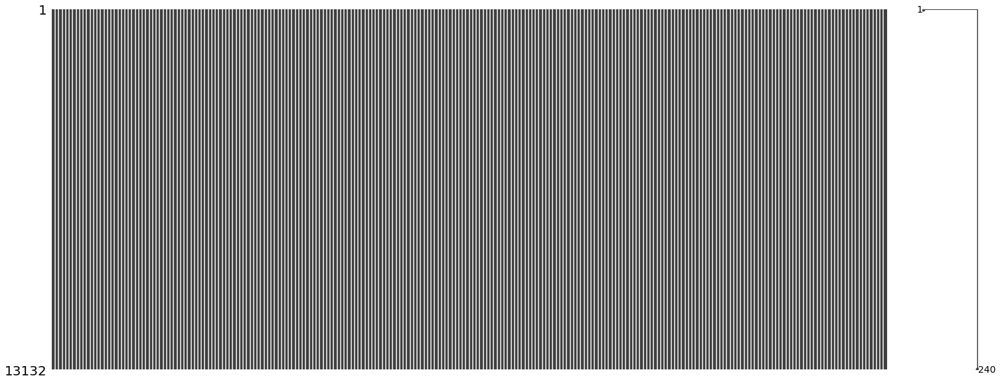

In [ ]:
ms.matrix(echonest)

In [ ]:
echonest.head(10)

,Unnamed: 0,echonest,echonest.1,echonest.2,echonest.3,echonest.4,echonest.5,echonest.6,echonest.7,echonest.13,echonest.14,echonest.20,echonest.21,echonest.22,echonest.23,echonest.24,echonest.25,echonest.26,echonest.27,echonest.28,echonest.29,echonest.30,echonest.31,echonest.32,echonest.33,echonest.34,echonest.35,echonest.36,echonest.37,echonest.38,echonest.39,echonest.40,echonest.41,echonest.42,echonest.43,echonest.44,echonest.45,echonest.46,echonest.47,echonest.48,echonest.49,echonest.50,echonest.51,echonest.52,echonest.53,echonest.54,echonest.55,echonest.56,echonest.57,echonest.58,echonest.59,echonest.60,echonest.61,echonest.62,echonest.63,echonest.64,echonest.65,echonest.66,echonest.67,echonest.68,echonest.69,echonest.70,echonest.71,echonest.72,echonest.73,echonest.74,echonest.75,echonest.76,echonest.77,echonest.78,echonest.79,echonest.80,echonest.81,echonest.82,echonest.83,echonest.84,echonest.85,echonest.86,echonest.87,echonest.88,echonest.89,echonest.90,echonest.91,echonest.92,echonest.93,echonest.94,echonest.95,echonest.96,echonest.97,echonest.98,echonest.99,echonest.100,echonest.101,echonest.102,echonest.103,echonest.104,echonest.105,echonest.106,echonest.107,echonest.108,echonest.109,echonest.110,echonest.111,echonest.112,echonest.113,echonest.114,echonest.115,echonest.116,echonest.117,echonest.118,echonest.119,echonest.120,echonest.121,echonest.122,echonest.123,echonest.124,echonest.125,echonest.126,echonest.127,echonest.128,echonest.129,echonest.130,echonest.131,echonest.132,echonest.133,echonest.134,echonest.135,echonest.136,echonest.137,echonest.138,echonest.139,echonest.140,echonest.141,echonest.142,echonest.143,echonest.144,echonest.145,echonest.146,echonest.147,echonest.148,echonest.149,echonest.150,echonest.151,echonest.152,echonest.153,echonest.154,echonest.155,echonest.156,echonest.157,echonest.158,echonest.159,echonest.160,echonest.161,echonest.162,echonest.163,echonest.164,echonest.165,echonest.166,echonest.167,echonest.168,echonest.169,echonest.170,echonest.171,echonest.172,echonest.173,echonest.174,echonest.175,echonest.176,echonest.177,echonest.178,echonest.179,echonest.180,echonest.181,echonest.182,echonest.183,echonest.184,echonest.185,echonest.186,echonest.187,echonest.188,echonest.189,echonest.190,echonest.191,echonest.192,echonest.193,echonest.194,echonest.195,echonest.196,echonest.197,echonest.198,echonest.199,echonest.200,echonest.201,echonest.202,echonest.203,echonest.204,echonest.205,echonest.206,echonest.207,echonest.208,echonest.209,echonest.210,echonest.211,echonest.212,echonest.213,echonest.214,echonest.215,echonest.216,echonest.217,echonest.218,echonest.219,echonest.220,echonest.221,echonest.222,echonest.223,echonest.224,echonest.225,echonest.226,echonest.227,echonest.228,echonest.229,echonest.230,echonest.231,echonest.232,echonest.233,echonest.234,echonest.235,echonest.236,echonest.237,echonest.238,echonest.239,echonest.240,echonest.241,echonest.242,echonest.243,echonest.244,echonest.245,echonest.246,echonest.247,echonest.248
0,NaN,audio_features,audio_features,audio_features,audio_features,audio_features,audio_features,audio_features,audio_features,metadata,metadata,social_features,social_features,social_features,social_features,social_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,temporal_features,t

In [ ]:
echonest.drop(0, axis=0, inplace=True)

In [ ]:
echonest.iloc[0, 0]

nan

In [ ]:
echonest.iloc[1, 0]

'track_id'

In [ ]:
echonest.iloc[0, 0] = echonest.iloc[1, 0]

In [ ]:
echonest.head(10)

,Unnamed: 0,echonest,echonest.1,echonest.2,echonest.3,echonest.4,echonest.5,echonest.6,echonest.7,echonest.13,echonest.14,echonest.20,echonest.21,echonest.22,echonest.23,echonest.24,echonest.25,echonest.26,echonest.27,echonest.28,echonest.29,echonest.30,echonest.31,echonest.32,echonest.33,echonest.34,echonest.35,echonest.36,echonest.37,echonest.38,echonest.39,echonest.40,echonest.41,echonest.42,echonest.43,echonest.44,echonest.45,echonest.46,echonest.47,echonest.48,echonest.49,echonest.50,echonest.51,echonest.52,echonest.53,echonest.54,echonest.55,echonest.56,echonest.57,echonest.58,echonest.59,echonest.60,echonest.61,echonest.62,echonest.63,echonest.64,echonest.65,echonest.66,echonest.67,echonest.68,echonest.69,echonest.70,echonest.71,echonest.72,echonest.73,echonest.74,echonest.75,echonest.76,echonest.77,echonest.78,echonest.79,echonest.80,echonest.81,echonest.82,echonest.83,echonest.84,echonest.85,echonest.86,echonest.87,echonest.88,echonest.89,echonest.90,echonest.91,echonest.92,echonest.93,echonest.94,echonest.95,echonest.96,echonest.97,echonest.98,echonest.99,echonest.100,echonest.101,echonest.102,echonest.103,echonest.104,echonest.105,echonest.106,echonest.107,echonest.108,echonest.109,echonest.110,echonest.111,echonest.112,echonest.113,echonest.114,echonest.115,echonest.116,echonest.117,echonest.118,echonest.119,echonest.120,echonest.121,echonest.122,echonest.123,echonest.124,echonest.125,echonest.126,echonest.127,echonest.128,echonest.129,echonest.130,echonest.131,echonest.132,echonest.133,echonest.134,echonest.135,echonest.136,echonest.137,echonest.138,echonest.139,echonest.140,echonest.141,echonest.142,echonest.143,echonest.144,echonest.145,echonest.146,echonest.147,echonest.148,echonest.149,echonest.150,echonest.151,echonest.152,echonest.153,echonest.154,echonest.155,echonest.156,echonest.157,echonest.158,echonest.159,echonest.160,echonest.161,echonest.162,echonest.163,echonest.164,echonest.165,echonest.166,echonest.167,echonest.168,echonest.169,echonest.170,echonest.171,echonest.172,echonest.173,echonest.174,echonest.175,echonest.176,echonest.177,echonest.178,echonest.179,echonest.180,echonest.181,echonest.182,echonest.183,echonest.184,echonest.185,echonest.186,echonest.187,echonest.188,echonest.189,echonest.190,echonest.191,echonest.192,echonest.193,echonest.194,echonest.195,echonest.196,echonest.197,echonest.198,echonest.199,echonest.200,echonest.201,echonest.202,echonest.203,echonest.204,echonest.205,echonest.206,echonest.207,echonest.208,echonest.209,echonest.210,echonest.211,echonest.212,echonest.213,echonest.214,echonest.215,echonest.216,echonest.217,echonest.218,echonest.219,echonest.220,echonest.221,echonest.222,echonest.223,echonest.224,echonest.225,echonest.226,echonest.227,echonest.228,echonest.229,echonest.230,echonest.231,echonest.232,echonest.233,echonest.234,echonest.235,echonest.236,echonest.237,echonest.238,echonest.239,echonest.240,echonest.241,echonest.242,echonest.243,echonest.244,echonest.245,echonest.246,echonest.247,echonest.248
1,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_name,release,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,1

In [ ]:
echonest.drop(2, axis=0, inplace=True)

In [ ]:
echonest.columns = echonest.iloc[0]

In [ ]:
echonest.head()

1,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_name,release,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223
1,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_name,release,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223
3,2,0.4166752327,0.6758939853,0.6344762684,0.0106280683,0.1776465712,0.1593100648,165.9220000000,0.5766609880,AWOL,AWOL - A Way Of Life,0.3889898648,0.3867400000,0.4063700000,0.0000000000,0.0000000000,0.8772332668,0.5889111161,0.3542430103,0.2950901389,0.2984125018,0.3094303906,0.3044959009,0.3345789909,0.2494945079,0.2596555948,0.3183763623,0.3719735742,1.0000000000,0.5709999800,0.2779999971,0.2099999934,0.2150000036,0.2285000086,0.2375000119,0.2790000141,0.1685000062,0.1685000062,0.2790000141,0.3324999809,0.0498478077,0.1042116806,0.0602296367,0.0522896349,0.0474028923,0.0528145321,0.0527327284,0.0622162186,0.0516130924,0.0573992468,0.0531989150,0.0625829771,0.0359999985,0.0179999992,0.0170000009,0.0209999997,0.0209999997,0.0099999998,0.0149999997,0.0410000011,0.0099999998,0.0089999996,0.0209999997,0.0130000003,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,0.9639999866,0.9819999933,0.9829999804,0.9789999723,0.9789999723,0.9900000095,0.9850000143,0.9589999914,0.9900000095,0.9909999967,0.9789999723,0.9869999886,-1.8993418217,-0.0326541141,0.8784691095,1.1475379467,0.9508557320,0.9482570291,1.1578869820,1.1479109526,1.6463184357,1.5301933289,1.1975679398,0.7456728220,2.5100378990,-1.5001832247,0.0305399895,0.6942420006,0.1704316139,0.0646948814,0.8747265339,0.7225761414,2.2513198853,1.7081594467,1.0548572540,0.0206749439,42.9491310120,44.3874359131,32.4093894958,15.6686668396,10.1140279770,-4.0692524910,2.0423531532,2.1883211136,-3.8059234619,-0.4946986735,6.0246696472,10.6925992966,44.4425010681,42.3885002136,31.6849994659,9.9875001907,9.5685005188,-7.1484999657,3.8315000534,1.8505001068,-2.6875000000,-0.7999999523,5.4615001678,10.2565002441,39.4948196411,1966.979125976

In [ ]:
echonest.drop(1, axis=0, inplace=True)

In [ ]:
echonest.head()

1,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_name,release,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223
3,2,0.4166752327,0.6758939853,0.6344762684,0.0106280683,0.1776465712,0.1593100648,165.9220000000,0.5766609880,AWOL,AWOL - A Way Of Life,0.3889898648,0.3867400000,0.4063700000,0.0000000000,0.0000000000,0.8772332668,0.5889111161,0.3542430103,0.2950901389,0.2984125018,0.3094303906,0.3044959009,0.3345789909,0.2494945079,0.2596555948,0.3183763623,0.3719735742,1.0000000000,0.5709999800,0.2779999971,0.2099999934,0.2150000036,0.2285000086,0.2375000119,0.2790000141,0.1685000062,0.1685000062,0.2790000141,0.3324999809,0.0498478077,0.1042116806,0.0602296367,0.0522896349,0.0474028923,0.0528145321,0.0527327284,0.0622162186,0.0516130924,0.0573992468,0.0531989150,0.0625829771,0.0359999985,0.0179999992,0.0170000009,0.0209999997,0.0209999997,0.0099999998,0.0149999997,0.0410000011,0.0099999998,0.0089999996,0.0209999997,0.0130000003,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,0.9639999866,0.9819999933,0.9829999804,0.9789999723,0.9789999723,0.9900000095,0.9850000143,0.9589999914,0.9900000095,0.9909999967,0.9789999723,0.9869999886,-1.8993418217,-0.0326541141,0.8784691095,1.1475379467,0.9508557320,0.9482570291,1.1578869820,1.1479109526,1.6463184357,1.5301933289,1.1975679398,0.7456728220,2.5100378990,-1.5001832247,0.0305399895,0.6942420006,0.1704316139,0.0646948814,0.8747265339,0.7225761414,2.2513198853,1.7081594467,1.0548572540,0.0206749439,42.9491310120,44.3874359131,32.4093894958,15.6686668396,10.1140279770,-4.0692524910,2.0423531532,2.1883211136,-3.8059234619,-0.4946986735,6.0246696472,10.6925992966,44.4425010681,42.3885002136,31.6849994659,9.9875001907,9.5685005188,-7.1484999657,3.8315000534,1.8505001068,-2.6875000000,-0.7999999523,5.4615001678,10.2565002441,39.4948196411,1966.9791259766,1825.1230468750,1903.7567138672,828.8100585938,911.1558227539,581.0153198242,722.0014038086,404.6825561523,315.5284729004,376.6324157715,229.2825469971,0.0000000000,-110.3679962158,-100.6050033569,-112.5810012817,-75.8820037842,-89.1600036621,-80.7379989624,-91.4980010986,-66.6490020752,-61.8450012207,-66.0810012817,-58.0439987183,52.0060005188,216.2369995117,208.4230041504,145.1940002441,97.4820022583,98.7229995728,68.0910034180,101.5889968872,69.5059967041,58.2270011902,69.2620010376,58.1759986877,52.0060005188,326.6049804688,309.0280151367,257.7749938965,173.3640136719,187.8829956055,148.8290100098,193.0870056152,136.1549987793,120.0720062256,135.3430023193,116.2200012207,-2.9521524906,0.0603787526,0.5259760022,0.3659146428,0.0181823578,0.4544309378,-0.3300074339,0.1493950188,-0.2148586661,0.0304272678,-0.1538770944,-0.1501315832,13.2062129974,1.0099339485,1.5771942139,0.3370234966,0.0971493721,0.4012596607,0.0063242912,0.6434857845,0.0120587349,0.2379474640,0.6559383869,1.2138643265,-12.4861459732,-11.2694997787,46.0312614441,-60.0000000000,-3.9330000877,56.0670013428,-2.58

In [ ]:
echonest.reset_index(inplace=True)

In [ ]:
echonest.head()

1,index,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_name,release,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223
0,3,2,0.4166752327,0.6758939853,0.6344762684,0.0106280683,0.1776465712,0.1593100648,165.9220000000,0.5766609880,AWOL,AWOL - A Way Of Life,0.3889898648,0.3867400000,0.4063700000,0.0000000000,0.0000000000,0.8772332668,0.5889111161,0.3542430103,0.2950901389,0.2984125018,0.3094303906,0.3044959009,0.3345789909,0.2494945079,0.2596555948,0.3183763623,0.3719735742,1.0000000000,0.5709999800,0.2779999971,0.2099999934,0.2150000036,0.2285000086,0.2375000119,0.2790000141,0.1685000062,0.1685000062,0.2790000141,0.3324999809,0.0498478077,0.1042116806,0.0602296367,0.0522896349,0.0474028923,0.0528145321,0.0527327284,0.0622162186,0.0516130924,0.0573992468,0.0531989150,0.0625829771,0.0359999985,0.0179999992,0.0170000009,0.0209999997,0.0209999997,0.0099999998,0.0149999997,0.0410000011,0.0099999998,0.0089999996,0.0209999997,0.0130000003,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,0.9639999866,0.9819999933,0.9829999804,0.9789999723,0.9789999723,0.9900000095,0.9850000143,0.9589999914,0.9900000095,0.9909999967,0.9789999723,0.9869999886,-1.8993418217,-0.0326541141,0.8784691095,1.1475379467,0.9508557320,0.9482570291,1.1578869820,1.1479109526,1.6463184357,1.5301933289,1.1975679398,0.7456728220,2.5100378990,-1.5001832247,0.0305399895,0.6942420006,0.1704316139,0.0646948814,0.8747265339,0.7225761414,2.2513198853,1.7081594467,1.0548572540,0.0206749439,42.9491310120,44.3874359131,32.4093894958,15.6686668396,10.1140279770,-4.0692524910,2.0423531532,2.1883211136,-3.8059234619,-0.4946986735,6.0246696472,10.6925992966,44.4425010681,42.3885002136,31.6849994659,9.9875001907,9.5685005188,-7.1484999657,3.8315000534,1.8505001068,-2.6875000000,-0.7999999523,5.4615001678,10.2565002441,39.4948196411,1966.9791259766,1825.1230468750,1903.7567138672,828.8100585938,911.1558227539,581.0153198242,722.0014038086,404.6825561523,315.5284729004,376.6324157715,229.2825469971,0.0000000000,-110.3679962158,-100.6050033569,-112.5810012817,-75.8820037842,-89.1600036621,-80.7379989624,-91.4980010986,-66.6490020752,-61.8450012207,-66.0810012817,-58.0439987183,52.0060005188,216.2369995117,208.4230041504,145.1940002441,97.4820022583,98.7229995728,68.0910034180,101.5889968872,69.5059967041,58.2270011902,69.2620010376,58.1759986877,52.0060005188,326.6049804688,309.0280151367,257.7749938965,173.3640136719,187.8829956055,148.8290100098,193.0870056152,136.1549987793,120.0720062256,135.3430023193,116.2200012207,-2.9521524906,0.0603787526,0.5259760022,0.3659146428,0.0181823578,0.4544309378,-0.3300074339,0.1493950188,-0.2148586661,0.0304272678,-0.1538770944,-0.1501315832,13.2062129974,1.0099339485,1.5771942139,0.3370234966,0.0971493721,0.4012596607,0.0063242912,0.6434857845,0.0120587349,0.2379474640,0.6559383869,1.2138643265,-12.4861459732,-11.2694997787,46.0312614441,-60.0000000000,-3.9330000877,56.06700134

In [ ]:
echonest.drop('index', inplace=True, axis=1)

In [ ]:
echonest.head()

1,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_name,release,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223
0,2,0.4166752327,0.6758939853,0.6344762684,0.0106280683,0.1776465712,0.1593100648,165.9220000000,0.5766609880,AWOL,AWOL - A Way Of Life,0.3889898648,0.3867400000,0.4063700000,0.0000000000,0.0000000000,0.8772332668,0.5889111161,0.3542430103,0.2950901389,0.2984125018,0.3094303906,0.3044959009,0.3345789909,0.2494945079,0.2596555948,0.3183763623,0.3719735742,1.0000000000,0.5709999800,0.2779999971,0.2099999934,0.2150000036,0.2285000086,0.2375000119,0.2790000141,0.1685000062,0.1685000062,0.2790000141,0.3324999809,0.0498478077,0.1042116806,0.0602296367,0.0522896349,0.0474028923,0.0528145321,0.0527327284,0.0622162186,0.0516130924,0.0573992468,0.0531989150,0.0625829771,0.0359999985,0.0179999992,0.0170000009,0.0209999997,0.0209999997,0.0099999998,0.0149999997,0.0410000011,0.0099999998,0.0089999996,0.0209999997,0.0130000003,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,0.9639999866,0.9819999933,0.9829999804,0.9789999723,0.9789999723,0.9900000095,0.9850000143,0.9589999914,0.9900000095,0.9909999967,0.9789999723,0.9869999886,-1.8993418217,-0.0326541141,0.8784691095,1.1475379467,0.9508557320,0.9482570291,1.1578869820,1.1479109526,1.6463184357,1.5301933289,1.1975679398,0.7456728220,2.5100378990,-1.5001832247,0.0305399895,0.6942420006,0.1704316139,0.0646948814,0.8747265339,0.7225761414,2.2513198853,1.7081594467,1.0548572540,0.0206749439,42.9491310120,44.3874359131,32.4093894958,15.6686668396,10.1140279770,-4.0692524910,2.0423531532,2.1883211136,-3.8059234619,-0.4946986735,6.0246696472,10.6925992966,44.4425010681,42.3885002136,31.6849994659,9.9875001907,9.5685005188,-7.1484999657,3.8315000534,1.8505001068,-2.6875000000,-0.7999999523,5.4615001678,10.2565002441,39.4948196411,1966.9791259766,1825.1230468750,1903.7567138672,828.8100585938,911.1558227539,581.0153198242,722.0014038086,404.6825561523,315.5284729004,376.6324157715,229.2825469971,0.0000000000,-110.3679962158,-100.6050033569,-112.5810012817,-75.8820037842,-89.1600036621,-80.7379989624,-91.4980010986,-66.6490020752,-61.8450012207,-66.0810012817,-58.0439987183,52.0060005188,216.2369995117,208.4230041504,145.1940002441,97.4820022583,98.7229995728,68.0910034180,101.5889968872,69.5059967041,58.2270011902,69.2620010376,58.1759986877,52.0060005188,326.6049804688,309.0280151367,257.7749938965,173.3640136719,187.8829956055,148.8290100098,193.0870056152,136.1549987793,120.0720062256,135.3430023193,116.2200012207,-2.9521524906,0.0603787526,0.5259760022,0.3659146428,0.0181823578,0.4544309378,-0.3300074339,0.1493950188,-0.2148586661,0.0304272678,-0.1538770944,-0.1501315832,13.2062129974,1.0099339485,1.5771942139,0.3370234966,0.0971493721,0.4012596607,0.0063242912,0.6434857845,0.0120587349,0.2379474640,0.6559383869,1.2138643265,-12.4861459732,-11.2694997787,46.0312614441,-60.0000000000,-3.9330000877,56.0670013428,-2.58

In [ ]:
type(echonest['acousticness'][0])

str

In [ ]:
def convert_to_float(df, columns):
    for i in columns:
        df[i] = df[i].astype('float')
    return df

In [ ]:
type(echonest['acousticness'][0])

str

In [ ]:
echonest = convert_to_float(echonest, set(echonest.columns) - set(['track_id', 'artist_name', 'release']))

In [ ]:
type(echonest['acousticness'][0])


numpy.float64

In [ ]:
echonest.head()

1,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_name,release,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223
0,2,0.416675,0.675894,0.634476,0.010628,0.177647,0.159310,165.922,0.576661,AWOL,AWOL - A Way Of Life,0.388990,0.386740,0.406370,0.000000,0.000000,0.877233,0.588911,0.354243,0.295090,0.298413,0.309430,0.304496,0.334579,0.249495,0.259656,0.318376,0.371974,1.000,0.5710,0.278,0.2100,0.2150,0.2285,0.2375,0.279,0.1685,0.1685,0.279,0.3325,0.049848,0.104212,0.060230,0.052290,0.047403,0.052815,0.052733,0.062216,0.051613,0.057399,0.053199,0.062583,0.036,0.018,0.017,0.021,0.021,0.010,0.015,0.041,0.010,0.009,0.021,0.013,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.964,0.982,0.983,0.979,0.979,0.990,0.985,0.959,0.990,0.991,0.979,0.987,-1.899342,-0.032654,0.878469,1.147538,0.950856,0.948257,1.157887,1.147911,1.646318,1.530193,1.197568,0.745673,2.510038,-1.500183,0.030540,0.694242,0.170432,0.064695,0.874727,0.722576,2.251320,1.708159,1.054857,0.020675,42.949131,44.387436,32.409389,15.668667,10.114028,-4.069252,2.042353,2.188321,-3.805923,-0.494699,6.024670,10.692599,44.442501,42.388500,31.684999,9.987500,9.568501,-7.1485,3.8315,1.8505,-2.6875,-0.800,5.4615,10.2565,39.494820,1966.979126,1825.123047,1903.756714,828.810059,911.155823,581.015320,722.001404,404.682556,315.528473,376.632416,229.282547,0.000,-110.367996,-100.605003,-112.581001,-75.882004,-89.160004,-80.737999,-91.498001,-66.649002,-61.845001,-66.081001,-58.043999,52.006001,216.237000,208.423004,145.194000,97.482002,98.723000,68.091003,101.588997,69.505997,58.227001,69.262001,58.175999,52.006001,326.604980,309.028015,257.774994,173.364014,187.882996,148.829010,193.087006,136.154999,120.072006,135.343002,116.220001,-2.952152,0.060379,0.525976,0.365915,0.018182,0.454431,-0.330007,0.149395,-0.214859,0.030427,-0.153877,-0.150132,13.206213,1.009934,1.577194,0.337023,0.097149,0.401260,0.006324,0.643486,0.012059,0.237947,0.655938,1.213864,-12.486146,-11.2695,46.031261,-60.000000,-3.933,56.067001,-2.587475,11.802585,0.047970,0.038275,0.000988,0.00000,0.20730,0.20730,1.603659,2.984276,-21.812077,-20.312000,49.157482,-60.0,-9.691,50.308998,-1.992303,6.805694,0.233070,0.192880,0.027455,0.06408,3.67696,3.61288,13.316690,262.929749
1,3,0.374408,0.528643,0.817461,0.001851,0.105880,0.461818,126.957,0.269240,AWOL,AWOL - A Way Of Life,0.388990,0.386740,0.406370,0.000000,0.000000,0.534429,0.537414,0.443299,0.390879,0.344573,0.366448,0.419455,0.747766,0.460901,0.392379,0.474559,0.406729,0.506,0.5145,0.387,0.3235,0.2805,0.3135,0.3455,0.898,0.4365,0.3385,0.398,0.3480,0.079207,0.083319,0.073595,0.071024,0.056679,0.066113,0.073889,0.088100,0.071305,0.059275,0.088222,0.067298,0.040,0.040,0.029,0.021,0.009,0.020,0.020,0.053,0.022,0.032,0.034,0.028,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.960,0.960,0.971,0.979,0.991,0.980,0.980,0.947,0.978,0.968,0.966,0.972,0.197378,0.182772,0.608394,0.785822,0.773479,0.650546,0.574605,-0.767804,0.326266,0.808435,0.506893,0.682139,-1.157548,-1.170147,-0.683188,-0.366574,-0.245357,-0.5476

In [ ]:
echonest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13129 entries, 0 to 13128
Columns: 240 entries, track_id to 223
dtypes: float64(237), object(3)
memory usage: 24.0+ MB


In [ ]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106577 entries, 0 to 106576
Columns: 519 entries, feature to zcr.6
dtypes: object(519)
memory usage: 422.0+ MB


In [ ]:
features.head(10)

,feature,chroma_cens,chroma_cens.1,chroma_cens.2,chroma_cens.3,chroma_cens.4,chroma_cens.5,chroma_cens.6,chroma_cens.7,chroma_cens.8,chroma_cens.9,chroma_cens.10,chroma_cens.11,chroma_cens.12,chroma_cens.13,chroma_cens.14,chroma_cens.15,chroma_cens.16,chroma_cens.17,chroma_cens.18,chroma_cens.19,chroma_cens.20,chroma_cens.21,chroma_cens.22,chroma_cens.23,chroma_cens.24,chroma_cens.25,chroma_cens.26,chroma_cens.27,chroma_cens.28,chroma_cens.29,chroma_cens.30,chroma_cens.31,chroma_cens.32,chroma_cens.33,chroma_cens.34,chroma_cens.35,chroma_cens.36,chroma_cens.37,chroma_cens.38,chroma_cens.39,chroma_cens.40,chroma_cens.41,chroma_cens.42,chroma_cens.43,chroma_cens.44,chroma_cens.45,chroma_cens.46,chroma_cens.47,chroma_cens.48,chroma_cens.49,chroma_cens.50,chroma_cens.51,chroma_cens.52,chroma_cens.53,chroma_cens.54,chroma_cens.55,chroma_cens.56,chroma_cens.57,chroma_cens.58,chroma_cens.59,chroma_cens.60,chroma_cens.61,chroma_cens.62,chroma_cens.63,chroma_cens.64,chroma_cens.65,chroma_cens.66,chroma_cens.67,chroma_cens.68,chroma_cens.69,chroma_cens.70,chroma_cens.71,chroma_cens.72,chroma_cens.73,chroma_cens.74,chroma_cens.75,chroma_cens.76,chroma_cens.77,chroma_cens.78,chroma_cens.79,chroma_cens.80,chroma_cens.81,chroma_cens.82,chroma_cens.83,chroma_cqt,chroma_cqt.1,chroma_cqt.2,chroma_cqt.3,chroma_cqt.4,chroma_cqt.5,chroma_cqt.6,chroma_cqt.7,chroma_cqt.8,chroma_cqt.9,chroma_cqt.10,chroma_cqt.11,chroma_cqt.12,chroma_cqt.13,chroma_cqt.14,chroma_cqt.15,chroma_cqt.16,chroma_cqt.17,chroma_cqt.18,chroma_cqt.19,chroma_cqt.20,chroma_cqt.21,chroma_cqt.22,chroma_cqt.23,chroma_cqt.24,chroma_cqt.25,chroma_cqt.26,chroma_cqt.27,chroma_cqt.28,chroma_cqt.29,chroma_cqt.30,chroma_cqt.31,chroma_cqt.32,chroma_cqt.33,chroma_cqt.34,chroma_cqt.35,chroma_cqt.36,chroma_cqt.37,chroma_cqt.38,chroma_cqt.39,chroma_cqt.40,chroma_cqt.41,chroma_cqt.42,chroma_cqt.43,chroma_cqt.44,chroma_cqt.45,chroma_cqt.46,chroma_cqt.47,chroma_cqt.48,chroma_cqt.49,chroma_cqt.50,chroma_cqt.51,chroma_cqt.52,chroma_cqt.53,chroma_cqt.54,chroma_cqt.55,chroma_cqt.56,chroma_cqt.57,chroma_cqt.58,chroma_cqt.59,chroma_cqt.60,chroma_cqt.61,chroma_cqt.62,chroma_cqt.63,chroma_cqt.64,chroma_cqt.65,chroma_cqt.66,chroma_cqt.67,chroma_cqt.68,chroma_cqt.69,chroma_cqt.70,chroma_cqt.71,chroma_cqt.72,chroma_cqt.73,chroma_cqt.74,chroma_cqt.75,chroma_cqt.76,chroma_cqt.77,chroma_cqt.78,chroma_cqt.79,chroma_cqt.80,chroma_cqt.81,chroma_cqt.82,chroma_cqt.83,chroma_stft,chroma_stft.1,chroma_stft.2,chroma_stft.3,chroma_stft.4,chroma_stft.5,chroma_stft.6,chroma_stft.7,chroma_stft.8,chroma_stft.9,chroma_stft.10,chroma_stft.11,chroma_stft.12,chroma_stft.13,chroma_stft.14,chroma_stft.15,chroma_stft.16,chroma_stft.17,chroma_stft.18,chroma_stft.19,chroma_stft.20,chroma_stft.21,chroma_stft.22,chroma_stft.23,chroma_stft.24,chroma_stft.25,chroma_stft.26,chroma_stft.27,chroma_stft.28,chroma_stft.29,chroma_stft.30,chroma_stft.31,chroma_stft.32,chroma_stft.33,chroma_stft.34,chroma_stft.35,chroma_stft.36,chroma_stft.37,chroma_stft.38,chroma_stft.39,chroma_stft.40,chroma_stft.41,chroma_stft.42,chroma_stft.43,chroma_stft.44,chroma_stft.45,chroma_stft.46,chroma_stft.47,chroma_stft.48,chroma_stft.49,chroma_stft.50,chroma_stft.51,chroma_stft.52,chroma_stft.53,chroma_stft.54,chroma_stft.55,chroma_stft.56,chroma_stft.57,chroma_stft.58,chroma_stft.59,chroma_stft.60,chroma_stft.61,chroma_stft.62,chroma_stft.63,chroma_stft.64,chroma_stft.65,chroma_stft.66,chroma_stft.67,chroma_stft.68,chroma_stft.69,chroma_stft.70,chroma_stft.71,chroma_stft.72,chroma_stft.73,chroma_stft.74,chroma_stft.75,chroma_stft.76,chroma_stft.77,chroma_stft.78,chroma_stft.79,chroma_stft.80,chroma_stft.81,chroma_stft.82,chroma_stft.83,mfcc,mfcc.1,mfcc.2,mfcc.3,mfcc.4,mfcc.5,mfcc.6,mfcc.7,mfcc.8,mfcc.9,mfcc.10,mfcc.11,mfcc.12,mfcc.13,mfcc.14,mfcc.15,mfcc.16,mfcc.17,mfcc.18,mfcc.19,mfcc.20,mfcc.21,mfcc.22,mfcc.23,mfcc.24,mfcc.25,mfcc.26,mfcc.27,mfcc.28,mfcc.29,mfcc.30,mfcc.31,mfcc.32,mfcc.33,mfcc.34,mfcc.35,mfcc.36,mfcc.37,mfcc.38,mfcc.39,mfcc.40,mfcc.41,mfcc.42

In [ ]:
features.iloc[0,0] = features.iloc[2, 0]

In [ ]:
features.head(3)

,feature,chroma_cens,chroma_cens.1,chroma_cens.2,chroma_cens.3,chroma_cens.4,chroma_cens.5,chroma_cens.6,chroma_cens.7,chroma_cens.8,chroma_cens.9,chroma_cens.10,chroma_cens.11,chroma_cens.12,chroma_cens.13,chroma_cens.14,chroma_cens.15,chroma_cens.16,chroma_cens.17,chroma_cens.18,chroma_cens.19,chroma_cens.20,chroma_cens.21,chroma_cens.22,chroma_cens.23,chroma_cens.24,chroma_cens.25,chroma_cens.26,chroma_cens.27,chroma_cens.28,chroma_cens.29,chroma_cens.30,chroma_cens.31,chroma_cens.32,chroma_cens.33,chroma_cens.34,chroma_cens.35,chroma_cens.36,chroma_cens.37,chroma_cens.38,chroma_cens.39,chroma_cens.40,chroma_cens.41,chroma_cens.42,chroma_cens.43,chroma_cens.44,chroma_cens.45,chroma_cens.46,chroma_cens.47,chroma_cens.48,chroma_cens.49,chroma_cens.50,chroma_cens.51,chroma_cens.52,chroma_cens.53,chroma_cens.54,chroma_cens.55,chroma_cens.56,chroma_cens.57,chroma_cens.58,chroma_cens.59,chroma_cens.60,chroma_cens.61,chroma_cens.62,chroma_cens.63,chroma_cens.64,chroma_cens.65,chroma_cens.66,chroma_cens.67,chroma_cens.68,chroma_cens.69,chroma_cens.70,chroma_cens.71,chroma_cens.72,chroma_cens.73,chroma_cens.74,chroma_cens.75,chroma_cens.76,chroma_cens.77,chroma_cens.78,chroma_cens.79,chroma_cens.80,chroma_cens.81,chroma_cens.82,chroma_cens.83,chroma_cqt,chroma_cqt.1,chroma_cqt.2,chroma_cqt.3,chroma_cqt.4,chroma_cqt.5,chroma_cqt.6,chroma_cqt.7,chroma_cqt.8,chroma_cqt.9,chroma_cqt.10,chroma_cqt.11,chroma_cqt.12,chroma_cqt.13,chroma_cqt.14,chroma_cqt.15,chroma_cqt.16,chroma_cqt.17,chroma_cqt.18,chroma_cqt.19,chroma_cqt.20,chroma_cqt.21,chroma_cqt.22,chroma_cqt.23,chroma_cqt.24,chroma_cqt.25,chroma_cqt.26,chroma_cqt.27,chroma_cqt.28,chroma_cqt.29,chroma_cqt.30,chroma_cqt.31,chroma_cqt.32,chroma_cqt.33,chroma_cqt.34,chroma_cqt.35,chroma_cqt.36,chroma_cqt.37,chroma_cqt.38,chroma_cqt.39,chroma_cqt.40,chroma_cqt.41,chroma_cqt.42,chroma_cqt.43,chroma_cqt.44,chroma_cqt.45,chroma_cqt.46,chroma_cqt.47,chroma_cqt.48,chroma_cqt.49,chroma_cqt.50,chroma_cqt.51,chroma_cqt.52,chroma_cqt.53,chroma_cqt.54,chroma_cqt.55,chroma_cqt.56,chroma_cqt.57,chroma_cqt.58,chroma_cqt.59,chroma_cqt.60,chroma_cqt.61,chroma_cqt.62,chroma_cqt.63,chroma_cqt.64,chroma_cqt.65,chroma_cqt.66,chroma_cqt.67,chroma_cqt.68,chroma_cqt.69,chroma_cqt.70,chroma_cqt.71,chroma_cqt.72,chroma_cqt.73,chroma_cqt.74,chroma_cqt.75,chroma_cqt.76,chroma_cqt.77,chroma_cqt.78,chroma_cqt.79,chroma_cqt.80,chroma_cqt.81,chroma_cqt.82,chroma_cqt.83,chroma_stft,chroma_stft.1,chroma_stft.2,chroma_stft.3,chroma_stft.4,chroma_stft.5,chroma_stft.6,chroma_stft.7,chroma_stft.8,chroma_stft.9,chroma_stft.10,chroma_stft.11,chroma_stft.12,chroma_stft.13,chroma_stft.14,chroma_stft.15,chroma_stft.16,chroma_stft.17,chroma_stft.18,chroma_stft.19,chroma_stft.20,chroma_stft.21,chroma_stft.22,chroma_stft.23,chroma_stft.24,chroma_stft.25,chroma_stft.26,chroma_stft.27,chroma_stft.28,chroma_stft.29,chroma_stft.30,chroma_stft.31,chroma_stft.32,chroma_stft.33,chroma_stft.34,chroma_stft.35,chroma_stft.36,chroma_stft.37,chroma_stft.38,chroma_stft.39,chroma_stft.40,chroma_stft.41,chroma_stft.42,chroma_stft.43,chroma_stft.44,chroma_stft.45,chroma_stft.46,chroma_stft.47,chroma_stft.48,chroma_stft.49,chroma_stft.50,chroma_stft.51,chroma_stft.52,chroma_stft.53,chroma_stft.54,chroma_stft.55,chroma_stft.56,chroma_stft.57,chroma_stft.58,chroma_stft.59,chroma_stft.60,chroma_stft.61,chroma_stft.62,chroma_stft.63,chroma_stft.64,chroma_stft.65,chroma_stft.66,chroma_stft.67,chroma_stft.68,chroma_stft.69,chroma_stft.70,chroma_stft.71,chroma_stft.72,chroma_stft.73,chroma_stft.74,chroma_stft.75,chroma_stft.76,chroma_stft.77,chroma_stft.78,chroma_stft.79,chroma_stft.80,chroma_stft.81,chroma_stft.82,chroma_stft.83,mfcc,mfcc.1,mfcc.2,mfcc.3,mfcc.4,mfcc.5,mfcc.6,mfcc.7,mfcc.8,mfcc.9,mfcc.10,mfcc.11,mfcc.12,mfcc.13,mfcc.14,mfcc.15,mfcc.16,mfcc.17,mfcc.18,mfcc.19,mfcc.20,mfcc.21,mfcc.22,mfcc.23,mfcc.24,mfcc.25,mfcc.26,mfcc.27,mfcc.28,mfcc.29,mfcc.30,mfcc.31,mfcc.32,mfcc.33,mfcc.34,mfcc.35,mfcc.36,mfcc.37,mfcc.38,mfcc.39,mfcc.40,mfcc.41,mfcc.42

In [ ]:
features.drop(2, inplace=True)

In [ ]:
len(features.columns)

519

In [ ]:
len(features.iloc[0])

519

In [ ]:
features.head(3)

,feature,chroma_cens,chroma_cens.1,chroma_cens.2,chroma_cens.3,chroma_cens.4,chroma_cens.5,chroma_cens.6,chroma_cens.7,chroma_cens.8,chroma_cens.9,chroma_cens.10,chroma_cens.11,chroma_cens.12,chroma_cens.13,chroma_cens.14,chroma_cens.15,chroma_cens.16,chroma_cens.17,chroma_cens.18,chroma_cens.19,chroma_cens.20,chroma_cens.21,chroma_cens.22,chroma_cens.23,chroma_cens.24,chroma_cens.25,chroma_cens.26,chroma_cens.27,chroma_cens.28,chroma_cens.29,chroma_cens.30,chroma_cens.31,chroma_cens.32,chroma_cens.33,chroma_cens.34,chroma_cens.35,chroma_cens.36,chroma_cens.37,chroma_cens.38,chroma_cens.39,chroma_cens.40,chroma_cens.41,chroma_cens.42,chroma_cens.43,chroma_cens.44,chroma_cens.45,chroma_cens.46,chroma_cens.47,chroma_cens.48,chroma_cens.49,chroma_cens.50,chroma_cens.51,chroma_cens.52,chroma_cens.53,chroma_cens.54,chroma_cens.55,chroma_cens.56,chroma_cens.57,chroma_cens.58,chroma_cens.59,chroma_cens.60,chroma_cens.61,chroma_cens.62,chroma_cens.63,chroma_cens.64,chroma_cens.65,chroma_cens.66,chroma_cens.67,chroma_cens.68,chroma_cens.69,chroma_cens.70,chroma_cens.71,chroma_cens.72,chroma_cens.73,chroma_cens.74,chroma_cens.75,chroma_cens.76,chroma_cens.77,chroma_cens.78,chroma_cens.79,chroma_cens.80,chroma_cens.81,chroma_cens.82,chroma_cens.83,chroma_cqt,chroma_cqt.1,chroma_cqt.2,chroma_cqt.3,chroma_cqt.4,chroma_cqt.5,chroma_cqt.6,chroma_cqt.7,chroma_cqt.8,chroma_cqt.9,chroma_cqt.10,chroma_cqt.11,chroma_cqt.12,chroma_cqt.13,chroma_cqt.14,chroma_cqt.15,chroma_cqt.16,chroma_cqt.17,chroma_cqt.18,chroma_cqt.19,chroma_cqt.20,chroma_cqt.21,chroma_cqt.22,chroma_cqt.23,chroma_cqt.24,chroma_cqt.25,chroma_cqt.26,chroma_cqt.27,chroma_cqt.28,chroma_cqt.29,chroma_cqt.30,chroma_cqt.31,chroma_cqt.32,chroma_cqt.33,chroma_cqt.34,chroma_cqt.35,chroma_cqt.36,chroma_cqt.37,chroma_cqt.38,chroma_cqt.39,chroma_cqt.40,chroma_cqt.41,chroma_cqt.42,chroma_cqt.43,chroma_cqt.44,chroma_cqt.45,chroma_cqt.46,chroma_cqt.47,chroma_cqt.48,chroma_cqt.49,chroma_cqt.50,chroma_cqt.51,chroma_cqt.52,chroma_cqt.53,chroma_cqt.54,chroma_cqt.55,chroma_cqt.56,chroma_cqt.57,chroma_cqt.58,chroma_cqt.59,chroma_cqt.60,chroma_cqt.61,chroma_cqt.62,chroma_cqt.63,chroma_cqt.64,chroma_cqt.65,chroma_cqt.66,chroma_cqt.67,chroma_cqt.68,chroma_cqt.69,chroma_cqt.70,chroma_cqt.71,chroma_cqt.72,chroma_cqt.73,chroma_cqt.74,chroma_cqt.75,chroma_cqt.76,chroma_cqt.77,chroma_cqt.78,chroma_cqt.79,chroma_cqt.80,chroma_cqt.81,chroma_cqt.82,chroma_cqt.83,chroma_stft,chroma_stft.1,chroma_stft.2,chroma_stft.3,chroma_stft.4,chroma_stft.5,chroma_stft.6,chroma_stft.7,chroma_stft.8,chroma_stft.9,chroma_stft.10,chroma_stft.11,chroma_stft.12,chroma_stft.13,chroma_stft.14,chroma_stft.15,chroma_stft.16,chroma_stft.17,chroma_stft.18,chroma_stft.19,chroma_stft.20,chroma_stft.21,chroma_stft.22,chroma_stft.23,chroma_stft.24,chroma_stft.25,chroma_stft.26,chroma_stft.27,chroma_stft.28,chroma_stft.29,chroma_stft.30,chroma_stft.31,chroma_stft.32,chroma_stft.33,chroma_stft.34,chroma_stft.35,chroma_stft.36,chroma_stft.37,chroma_stft.38,chroma_stft.39,chroma_stft.40,chroma_stft.41,chroma_stft.42,chroma_stft.43,chroma_stft.44,chroma_stft.45,chroma_stft.46,chroma_stft.47,chroma_stft.48,chroma_stft.49,chroma_stft.50,chroma_stft.51,chroma_stft.52,chroma_stft.53,chroma_stft.54,chroma_stft.55,chroma_stft.56,chroma_stft.57,chroma_stft.58,chroma_stft.59,chroma_stft.60,chroma_stft.61,chroma_stft.62,chroma_stft.63,chroma_stft.64,chroma_stft.65,chroma_stft.66,chroma_stft.67,chroma_stft.68,chroma_stft.69,chroma_stft.70,chroma_stft.71,chroma_stft.72,chroma_stft.73,chroma_stft.74,chroma_stft.75,chroma_stft.76,chroma_stft.77,chroma_stft.78,chroma_stft.79,chroma_stft.80,chroma_stft.81,chroma_stft.82,chroma_stft.83,mfcc,mfcc.1,mfcc.2,mfcc.3,mfcc.4,mfcc.5,mfcc.6,mfcc.7,mfcc.8,mfcc.9,mfcc.10,mfcc.11,mfcc.12,mfcc.13,mfcc.14,mfcc.15,mfcc.16,mfcc.17,mfcc.18,mfcc.19,mfcc.20,mfcc.21,mfcc.22,mfcc.23,mfcc.24,mfcc.25,mfcc.26,mfcc.27,mfcc.28,mfcc.29,mfcc.30,mfcc.31,mfcc.32,mfcc.33,mfcc.34,mfcc.35,mfcc.36,mfcc.37,mfcc.38,mfcc.39,mfcc.40,mfcc.41,mfcc.42

In [ ]:
def combine_two_rows(df):
    columns = list(df.columns)
    for i in range(0, 519):
        columns[i] = columns[i] + " " + df.iloc[0, i]
    return columns

In [ ]:
features.columns = combine_two_rows(features)

In [ ]:
features.head()

,feature track_id,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_cqt.62 skew,chroma_cqt.63 skew,chroma_cqt.64 skew,chroma_cqt.65 skew,chroma_cqt.66 skew,chroma_cqt.67 skew,chroma_cqt.68 skew,chroma_cqt.69 skew,chroma_cqt.70 skew,chroma_cqt.71 skew,chroma_cqt.72 std,chroma_cqt.73 std,chroma_cqt.74 std,chroma_cqt.75 std,chroma_cqt.76 std,chroma_cqt.77 std,chroma_cqt.78 std,chroma_cqt.79 std,chroma_cqt.80 std,chroma_cqt.81 std,chroma_cqt.82 std,chroma_cqt.83 std,chroma_stft kurtosis,chroma_stft.1 kurtosis,chroma_stft.2 kurtosis,chroma_stft.3 kurtosis,chroma_stft.4 kurtosis,chroma_stft.5 kurtosis,chroma_stft.6 kurtosis,chroma_stft.7 kurtosis,chroma_stft.8 kurtosis,chroma_stft.9 kurtosis,chroma_stft.10 kurtosis,chroma_stft.11 kurtosis,chroma_stft.12 max,chroma_stft.13 max,chroma_stft.14 max,chroma_stft.15 max,chroma_stft.16 max,chroma_stft.17 max,chroma_stft.18 max,chroma_stft.19 max,chroma_stft.20 max,chroma_stft.21 max,chroma_stft.22 max,chroma_stft.23 max,chroma_stft.24 mean,chroma_stft.25 mean,chroma_stft.26 mean,chroma_stft.27 mean,chroma_stft.28 mean,chroma_stft.29 mean,chroma_stft.30 mean,chroma_stft.31

In [ ]:
features.drop([0, 1], inplace=True)

In [ ]:
features.reset_index(inplace=True)

In [ ]:
features.drop('index', axis=1, inplace=True)

In [ ]:
features.head()

,feature track_id,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_cqt.62 skew,chroma_cqt.63 skew,chroma_cqt.64 skew,chroma_cqt.65 skew,chroma_cqt.66 skew,chroma_cqt.67 skew,chroma_cqt.68 skew,chroma_cqt.69 skew,chroma_cqt.70 skew,chroma_cqt.71 skew,chroma_cqt.72 std,chroma_cqt.73 std,chroma_cqt.74 std,chroma_cqt.75 std,chroma_cqt.76 std,chroma_cqt.77 std,chroma_cqt.78 std,chroma_cqt.79 std,chroma_cqt.80 std,chroma_cqt.81 std,chroma_cqt.82 std,chroma_cqt.83 std,chroma_stft kurtosis,chroma_stft.1 kurtosis,chroma_stft.2 kurtosis,chroma_stft.3 kurtosis,chroma_stft.4 kurtosis,chroma_stft.5 kurtosis,chroma_stft.6 kurtosis,chroma_stft.7 kurtosis,chroma_stft.8 kurtosis,chroma_stft.9 kurtosis,chroma_stft.10 kurtosis,chroma_stft.11 kurtosis,chroma_stft.12 max,chroma_stft.13 max,chroma_stft.14 max,chroma_stft.15 max,chroma_stft.16 max,chroma_stft.17 max,chroma_stft.18 max,chroma_stft.19 max,chroma_stft.20 max,chroma_stft.21 max,chroma_stft.22 max,chroma_stft.23 max,chroma_stft.24 mean,chroma_stft.25 mean,chroma_stft.26 mean,chroma_stft.27 mean,chroma_stft.28 mean,chroma_stft.29 mean,chroma_stft.30 mean,chroma_stft.31

In [ ]:
features = features.astype(dtype='float')
features['feature track_id'] = features['feature track_id'].astype('int')

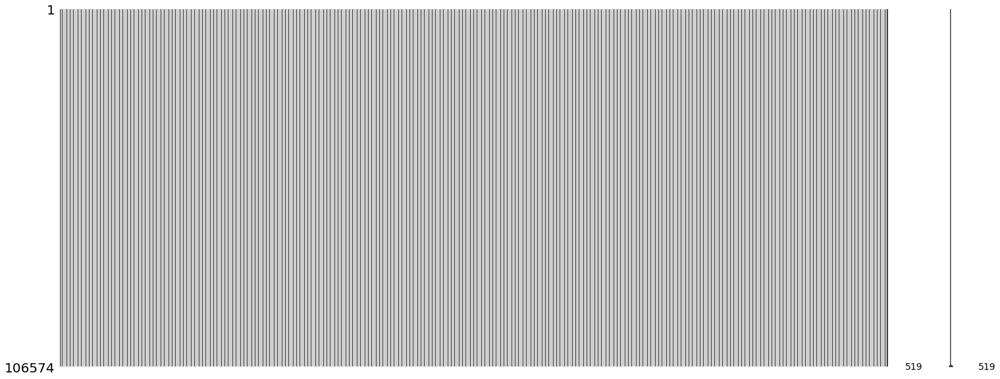

In [ ]:
ms.matrix(features)

In [ ]:
features.head()

,feature track_id,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_cqt.62 skew,chroma_cqt.63 skew,chroma_cqt.64 skew,chroma_cqt.65 skew,chroma_cqt.66 skew,chroma_cqt.67 skew,chroma_cqt.68 skew,chroma_cqt.69 skew,chroma_cqt.70 skew,chroma_cqt.71 skew,chroma_cqt.72 std,chroma_cqt.73 std,chroma_cqt.74 std,chroma_cqt.75 std,chroma_cqt.76 std,chroma_cqt.77 std,chroma_cqt.78 std,chroma_cqt.79 std,chroma_cqt.80 std,chroma_cqt.81 std,chroma_cqt.82 std,chroma_cqt.83 std,chroma_stft kurtosis,chroma_stft.1 kurtosis,chroma_stft.2 kurtosis,chroma_stft.3 kurtosis,chroma_stft.4 kurtosis,chroma_stft.5 kurtosis,chroma_stft.6 kurtosis,chroma_stft.7 kurtosis,chroma_stft.8 kurtosis,chroma_stft.9 kurtosis,chroma_stft.10 kurtosis,chroma_stft.11 kurtosis,chroma_stft.12 max,chroma_stft.13 max,chroma_stft.14 max,chroma_stft.15 max,chroma_stft.16 max,chroma_stft.17 max,chroma_stft.18 max,chroma_stft.19 max,chroma_stft.20 max,chroma_stft.21 max,chroma_stft.22 max,chroma_stft.23 max,chroma_stft.24 mean,chroma_stft.25 mean,chroma_stft.26 mean,chroma_stft.27 mean,chroma_stft.28 mean,chroma_stft.29 mean,chroma_stft.30 mean,chroma_stft.31

In [ ]:
tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106576 entries, 0 to 106575
Data columns (total 53 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  106575 non-null  object
 1   album       106575 non-null  object
 2   album.1     103046 non-null  object
 3   album.2     70295 non-null   object
 4   album.3     15296 non-null   object
 5   album.4     106575 non-null  object
 6   album.5     106575 non-null  object
 7   album.6     83150 non-null   object
 8   album.7     106575 non-null  object
 9   album.8     18061 non-null   object
 10  album.9     106575 non-null  object
 11  album.10    105550 non-null  object
 12  album.11    106575 non-null  object
 13  album.12    100067 non-null  object
 14  artist      22712 non-null   object
 15  artist.1    5376 non-null    object
 16  artist.2    14272 non-null   object
 17  artist.3    71157 non-null   object
 18  artist.4    106575 non-null  object
 19  artist.5    105719 non-

In [ ]:
tracks.head()

,Unnamed: 0,album,album.1,album.2,album.3,album.4,album.5,album.6,album.7,album.8,album.9,album.10,album.11,album.12,artist,artist.1,artist.2,artist.3,artist.4,artist.5,artist.6,artist.7,artist.8,artist.9,artist.10,artist.11,artist.12,artist.13,artist.14,artist.15,artist.16,set,set.1,track,track.1,track.2,track.3,track.4,track.5,track.6,track.7,track.8,track.9,track.10,track.11,track.12,track.13,track.14,track.15,track.16,track.17,track.18,track.19
0,NaN,comments,date_created,date_released,engineer,favorites,id,information,listens,producer,tags,title,tracks,type,active_year_begin,active_year_end,associated_labels,bio,comments,date_created,favorites,id,latitude,location,longitude,members,name,related_projects,tags,website,wikipedia_page,split,subset,bit_rate,comments,composer,date_created,date_recorded,duration,favorites,genre_top,genres,genres_all,information,interest,language_code,license,listens,lyricist,number,publisher,tags,title
1,track_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,small,256000,0,NaN,2008-11-26 01:48:12,2008-11-26 00:00:00,168,2,Hip-Hop,[21],[21],NaN,4656,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1293,NaN,3,NaN,[],Food
3,3,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,medium,256000,0,NaN,2008-11-26 01:48:14,2008-11-26 00:00:00,237,1,Hip-Hop,[21],[21],NaN,1470,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,514,NaN,4,NaN,[],Electric Ave
4,5,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,small,256000,0,NaN,2008-11-26 01:48:20,2008-11-26 00:00:00,206,6,Hip-Hop,[21],[21],NaN,1933,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1151,NaN,6,NaN,[],This World


In [ ]:
tracks.iloc[0,0] = tracks.iloc[1, 0]

In [ ]:
tracks.drop(1, axis=0, inplace=True)

In [ ]:
tracks.head()

,Unnamed: 0,album,album.1,album.2,album.3,album.4,album.5,album.6,album.7,album.8,album.9,album.10,album.11,album.12,artist,artist.1,artist.2,artist.3,artist.4,artist.5,artist.6,artist.7,artist.8,artist.9,artist.10,artist.11,artist.12,artist.13,artist.14,artist.15,artist.16,set,set.1,track,track.1,track.2,track.3,track.4,track.5,track.6,track.7,track.8,track.9,track.10,track.11,track.12,track.13,track.14,track.15,track.16,track.17,track.18,track.19
0,track_id,comments,date_created,date_released,engineer,favorites,id,information,listens,producer,tags,title,tracks,type,active_year_begin,active_year_end,associated_labels,bio,comments,date_created,favorites,id,latitude,location,longitude,members,name,related_projects,tags,website,wikipedia_page,split,subset,bit_rate,comments,composer,date_created,date_recorded,duration,favorites,genre_top,genres,genres_all,information,interest,language_code,license,listens,lyricist,number,publisher,tags,title
2,2,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,small,256000,0,NaN,2008-11-26 01:48:12,2008-11-26 00:00:00,168,2,Hip-Hop,[21],[21],NaN,4656,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1293,NaN,3,NaN,[],Food
3,3,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,medium,256000,0,NaN,2008-11-26 01:48:14,2008-11-26 00:00:00,237,1,Hip-Hop,[21],[21],NaN,1470,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,514,NaN,4,NaN,[],Electric Ave
4,5,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,small,256000,0,NaN,2008-11-26 01:48:20,2008-11-26 00:00:00,206,6,Hip-Hop,[21],[21],NaN,1933,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1151,NaN,6,NaN,[],This World
5,10,0,2008-11-26 01:45:08,2008-02-06 00:00:00,NaN,4,6,NaN,47632,NaN,[],Constant Hitmaker,2,Album,NaN,NaN,"Mexican Summer, Richie Records, Woodsist, Skul...","<p><span style=""font-family:Verdana, Geneva, A...",3,2008-11-26 01:42:55,74,6,NaN,NaN,NaN,"Kurt Vile, the Violators",Kurt Vile,NaN,"['philly', 'kurt vile']",http://kurtvile.com,NaN,training,small,192000,0,Kurt Vile,2008-11-25 17:49:06,2008-11-26 00:00:00,161,178,Pop,[10],[10],NaN,54881,en,Attribution-NonCommercial-NoDerivatives (aka M...,50135,NaN,1,NaN,[],Freeway


In [ ]:
len(tracks.columns)

53

In [ ]:
def combine_one_row(df):
    columns = list(df.columns)
    for i in range(0, 53):
        if i == 0:
            columns[i] = df.iloc[0, i]
        else:
            columns[i] = columns[i] + " " + df.iloc[0, i]
    return columns

In [ ]:
tracks.columns = combine_one_row(tracks)

In [ ]:
tracks.head()

,track_id,album comments,album.1 date_created,album.2 date_released,album.3 engineer,album.4 favorites,album.5 id,album.6 information,album.7 listens,album.8 producer,album.9 tags,album.10 title,album.11 tracks,album.12 type,artist active_year_begin,artist.1 active_year_end,artist.2 associated_labels,artist.3 bio,artist.4 comments,artist.5 date_created,artist.6 favorites,artist.7 id,artist.8 latitude,artist.9 location,artist.10 longitude,artist.11 members,artist.12 name,artist.13 related_projects,artist.14 tags,artist.15 website,artist.16 wikipedia_page,set split,set.1 subset,track bit_rate,track.1 comments,track.2 composer,track.3 date_created,track.4 date_recorded,track.5 duration,track.6 favorites,track.7 genre_top,track.8 genres,track.9 genres_all,track.10 information,track.11 interest,track.12 language_code,track.13 license,track.14 listens,track.15 lyricist,track.16 number,track.17 publisher,track.18 tags,track.19 title
0,track_id,comments,date_created,date_released,engineer,favorites,id,information,listens,producer,tags,title,tracks,type,active_year_begin,active_year_end,associated_labels,bio,comments,date_created,favorites,id,latitude,location,longitude,members,name,related_projects,tags,website,wikipedia_page,split,subset,bit_rate,comments,composer,date_created,date_recorded,duration,favorites,genre_top,genres,genres_all,information,interest,language_code,license,listens,lyricist,number,publisher,tags,title
2,2,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,small,256000,0,NaN,2008-11-26 01:48:12,2008-11-26 00:00:00,168,2,Hip-Hop,[21],[21],NaN,4656,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1293,NaN,3,NaN,[],Food
3,3,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,medium,256000,0,NaN,2008-11-26 01:48:14,2008-11-26 00:00:00,237,1,Hip-Hop,[21],[21],NaN,1470,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,514,NaN,4,NaN,[],Electric Ave
4,5,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,small,256000,0,NaN,2008-11-26 01:48:20,2008-11-26 00:00:00,206,6,Hip-Hop,[21],[21],NaN,1933,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1151,NaN,6,NaN,[],This World
5,10,0,2008-11-26 01:45:08,2008-02-06 00:00:00,NaN,4,6,NaN,47632,NaN,[],Constant Hitmaker,2,Album,NaN,NaN,"Mexican Summer, Richie Records, Woodsist, Skul...","<p><span style=""font-family:Verdana, Geneva, A...",3,2008-11-26 01:42:55,74,6,NaN,NaN,NaN,"Kurt Vile, the Violators",Kurt Vile,NaN,"['philly', 'kurt vile']",http://kurtvile.com,NaN,training,small,192000,0,Kurt Vile,2008-11-25 17:49:06,2008-11-26 00:00:00,161,178,Pop,[10],[10],NaN,54881,en,Attribution-NonCommercial-NoDerivatives (aka M...,50135,NaN,1,NaN,[],Freeway


In [ ]:
tracks.drop(0, inplace=True)

In [ ]:
tracks.reset_index(inplace=True)

In [ ]:
tracks.drop(['index'], axis=1, inplace=True)

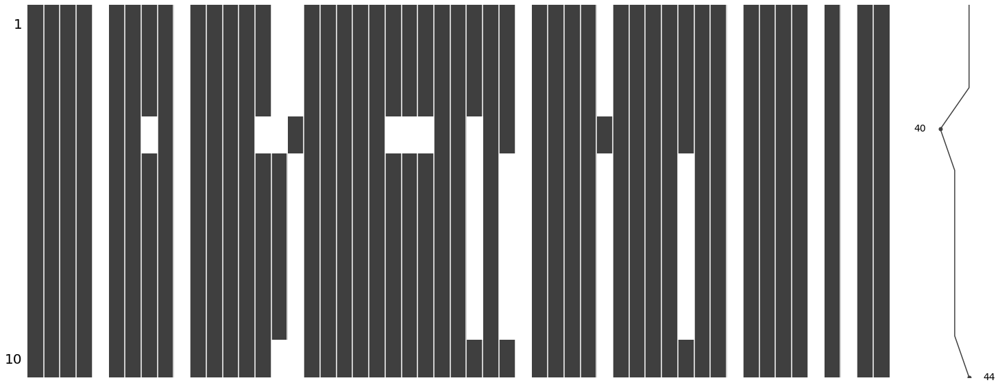

In [ ]:
ms.matrix(tracks.iloc[0: 10])

In [ ]:
tracks.head()

,track_id,album comments,album.1 date_created,album.2 date_released,album.3 engineer,album.4 favorites,album.5 id,album.6 information,album.7 listens,album.8 producer,album.9 tags,album.10 title,album.11 tracks,album.12 type,artist active_year_begin,artist.1 active_year_end,artist.2 associated_labels,artist.3 bio,artist.4 comments,artist.5 date_created,artist.6 favorites,artist.7 id,artist.8 latitude,artist.9 location,artist.10 longitude,artist.11 members,artist.12 name,artist.13 related_projects,artist.14 tags,artist.15 website,artist.16 wikipedia_page,set split,set.1 subset,track bit_rate,track.1 comments,track.2 composer,track.3 date_created,track.4 date_recorded,track.5 duration,track.6 favorites,track.7 genre_top,track.8 genres,track.9 genres_all,track.10 information,track.11 interest,track.12 language_code,track.13 license,track.14 listens,track.15 lyricist,track.16 number,track.17 publisher,track.18 tags,track.19 title
0,2,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,small,256000,0,NaN,2008-11-26 01:48:12,2008-11-26 00:00:00,168,2,Hip-Hop,[21],[21],NaN,4656,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1293,NaN,3,NaN,[],Food
1,3,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,medium,256000,0,NaN,2008-11-26 01:48:14,2008-11-26 00:00:00,237,1,Hip-Hop,[21],[21],NaN,1470,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,514,NaN,4,NaN,[],Electric Ave
2,5,0,2008-11-26 01:44:45,2009-01-05 00:00:00,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album,2006-01-01 00:00:00,NaN,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.0583238,New Jersey,-74.4056612,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,['awol'],http://www.AzillionRecords.blogspot.com,NaN,training,small,256000,0,NaN,2008-11-26 01:48:20,2008-11-26 00:00:00,206,6,Hip-Hop,[21],[21],NaN,1933,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1151,NaN,6,NaN,[],This World
3,10,0,2008-11-26 01:45:08,2008-02-06 00:00:00,NaN,4,6,NaN,47632,NaN,[],Constant Hitmaker,2,Album,NaN,NaN,"Mexican Summer, Richie Records, Woodsist, Skul...","<p><span style=""font-family:Verdana, Geneva, A...",3,2008-11-26 01:42:55,74,6,NaN,NaN,NaN,"Kurt Vile, the Violators",Kurt Vile,NaN,"['philly', 'kurt vile']",http://kurtvile.com,NaN,training,small,192000,0,Kurt Vile,2008-11-25 17:49:06,2008-11-26 00:00:00,161,178,Pop,[10],[10],NaN,54881,en,Attribution-NonCommercial-NoDerivatives (aka M...,50135,NaN,1,NaN,[],Freeway
4,20,0,2008-11-26 01:45:05,2009-01-06 00:00:00,NaN,2,4,"<p> ""spiritual songs"" from Nicky Cook</p>",2710,NaN,[],Niris,13,Album,1990-01-01 00:00:00,2011-01-01 00:00:00,NaN,<p>Songs written by: Nicky Cook</p>\n<p>VOCALS...,2,2008-11-26 01:42:52,10,4,51.895927,Colchester England,0.891874,Nicky Cook\n,Nicky Cook,NaN,"['instrumentals', 'experimental pop', 'post pu...",NaN,NaN,training,large,256000,0,NaN,2008-11-26 01:48:56,2008-01-01 00:00:00,311,0,NaN,"[76, 103]","[17, 10, 76, 103]",NaN,978,en,Attribution-NonCommercial-NoDerivatives (aka M...,361,NaN,3,NaN,[],Spiritual Level


In [ ]:
tracks['track.7 genre_top'].value_counts()

Rock                   14182
Experimental           10608
Electronic              9372
Hip-Hop                 3552
Folk                    2803
Pop                     2332
Instrumental            2079
International           1389
Classical               1230
Jazz                     571
Old-Time / Historic      554
Spoken                   423
Country                  194
Soul-RnB                 175
Blues                    110
Easy Listening            24
Name: track.7 genre_top, dtype: int64

In [ ]:
track_title = pd.DataFrame(tracks['track.19 title'])

In [ ]:
track_title

,track.19 title
0,Food
1,Electric Ave
2,This World
3,Freeway
4,Spiritual Level
...,...
106569,The Auger
106570,Let's Skin Ruby
106571,My House Smells Like Kim Deal/Pulp
106572,The Man With Two Mouths


In [ ]:
track_title['track_id'] = tracks['track_id']

In [ ]:
track_title

,track.19 title,track_id
0,Food,2
1,Electric Ave,3
2,This World,5
3,Freeway,10
4,Spiritual Level,20
...,...,...
106569,The Auger,155316
106570,Let's Skin Ruby,155317
106571,My House Smells Like Kim Deal/Pulp,155318
106572,The Man With Two Mouths,155319


In [ ]:
track_title.shape


(106574, 2)

In [ ]:
tracks.drop(['album comments','album.1 date_created', 
             'album.2 date_released', 'album.11 tracks', 
             'album.9 tags', 'album.8 producer', 'album.3 engineer', 'album.6 information',
             'artist active_year_begin', 'artist.1 active_year_end', 'artist.2 associated_labels',
             'artist.3 bio','artist.4 comments','artist.5 date_created', 'artist.7 id',
             'artist.8 latitude','artist.9 location','artist.10 longitude', 'artist.11 members',
             'artist.13 related_projects', 'artist.14 tags','artist.15 website','artist.16 wikipedia_page',
             'set.1 subset', 'track.1 comments', 'track.2 composer', 'track.3 date_created', 'track.4 date_recorded',
             'track.10 information', 'track.13 license', 'track.15 lyricist', 'track.17 publisher', 'track.18 tags',
             'track.19 title'], axis=1, inplace=True)

In [ ]:
tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106574 entries, 0 to 106573
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   track_id                106574 non-null  object
 1   album.4 favorites       106574 non-null  object
 2   album.5 id              106574 non-null  object
 3   album.7 listens         106574 non-null  object
 4   album.10 title          105549 non-null  object
 5   album.12 type           100066 non-null  object
 6   artist.6 favorites      106574 non-null  object
 7   artist.12 name          106574 non-null  object
 8   set split               106574 non-null  object
 9   track bit_rate          106574 non-null  object
 10  track.5 duration        106574 non-null  object
 11  track.6 favorites       106574 non-null  object
 12  track.7 genre_top       49598 non-null   object
 13  track.8 genres          106574 non-null  object
 14  track.9 genres_all      106574 non-n

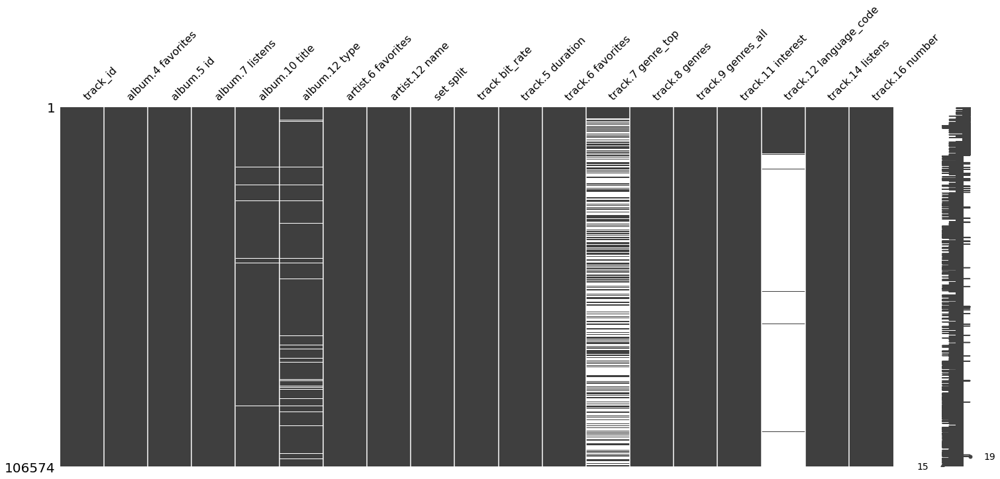

In [ ]:
ms.matrix(tracks)

In [ ]:
tracks['album.12 type'].value_counts()

Album               87549
Radio Program        6551
Live Performance     5035
Single Tracks         917
Contest                14
Name: album.12 type, dtype: int64

In [ ]:
tracks['album.10 title'].value_counts()

microSong Entries                                              310
Sectioned v4.0                                                 200
Live at the 2014 Golden Festival                               168
INTO INFINITY: an exploration of on and on and on and on...    151
Necktar Volume 6                                               150
                                                              ... 
Take Me                                                          1
LIVE @ CINDERS GALLERY 7/21/2010                                 1
Burgers                                                          1
Balkan Spezialitaeten                                            1
Seeing Stars (Single)                                            1
Name: album.10 title, Length: 14298, dtype: int64

In [ ]:
tracks['album.10 title']

0                  AWOL - A Way Of Life
1                  AWOL - A Way Of Life
2                  AWOL - A Way Of Life
3                     Constant Hitmaker
4                                 Niris
                      ...              
106569    Live at Monty Hall, 2/17/2017
106570    Live at Monty Hall, 2/17/2017
106571    Live at Monty Hall, 2/17/2017
106572    Live at Monty Hall, 2/17/2017
106573        What I Tell Myself Vol. 2
Name: album.10 title, Length: 106574, dtype: object

In [ ]:
tracks['album.10 title'].fillna(method='ffill', inplace=True)

In [ ]:
tracks['album.10 title'].value_counts()

microSong Entries                                              329
Sectioned v4.0                                                 200
Live at the 2014 Golden Festival                               168
INTO INFINITY: an exploration of on and on and on and on...    151
Necktar Volume 6                                               151
                                                              ... 
Live at The Parkside                                             1
Live @ ISSUE (6/11/10)                                           1
Live on WFMU with Daniel Blumin: June 15, 2014                   1
Psalms And Hymnals From the 32nd Galactic Empire                 1
Wake up                                                          1
Name: album.10 title, Length: 14298, dtype: int64

In [ ]:
tracks['album.10 title']

0                  AWOL - A Way Of Life
1                  AWOL - A Way Of Life
2                  AWOL - A Way Of Life
3                     Constant Hitmaker
4                                 Niris
                      ...              
106569    Live at Monty Hall, 2/17/2017
106570    Live at Monty Hall, 2/17/2017
106571    Live at Monty Hall, 2/17/2017
106572    Live at Monty Hall, 2/17/2017
106573        What I Tell Myself Vol. 2
Name: album.10 title, Length: 106574, dtype: object

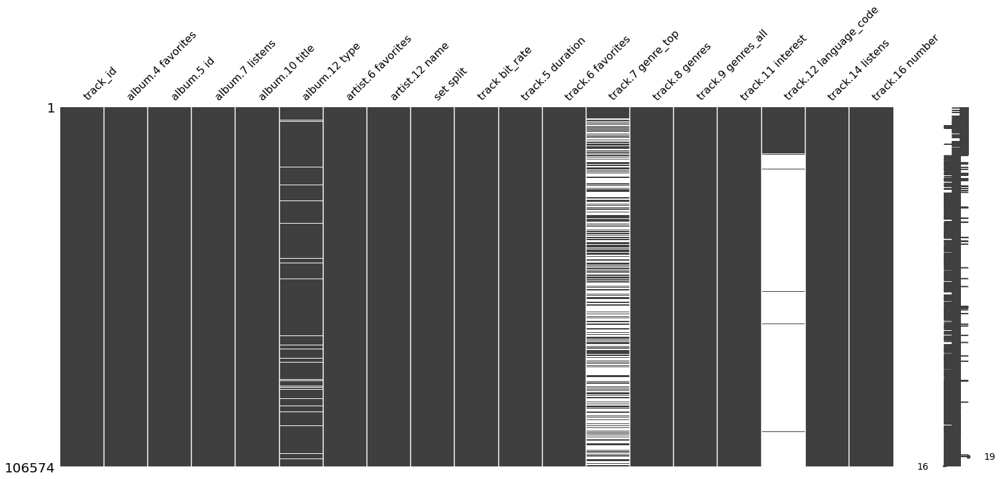

In [ ]:
ms.matrix(tracks)

In [ ]:
tracks.drop(['track.12 language_code', 'album.12 type'], axis=1, inplace=True)

In [ ]:
tracks.head()

,track_id,album.4 favorites,album.5 id,album.7 listens,album.10 title,artist.6 favorites,artist.12 name,set split,track bit_rate,track.5 duration,track.6 favorites,track.7 genre_top,track.8 genres,track.9 genres_all,track.11 interest,track.14 listens,track.16 number
0,2,4,1,6073,AWOL - A Way Of Life,9,AWOL,training,256000,168,2,Hip-Hop,[21],[21],4656,1293,3
1,3,4,1,6073,AWOL - A Way Of Life,9,AWOL,training,256000,237,1,Hip-Hop,[21],[21],1470,514,4
2,5,4,1,6073,AWOL - A Way Of Life,9,AWOL,training,256000,206,6,Hip-Hop,[21],[21],1933,1151,6
3,10,4,6,47632,Constant Hitmaker,74,Kurt Vile,training,192000,161,178,Pop,[10],[10],54881,50135,1
4,20,2,4,2710,Niris,10,Nicky Cook,training,256000,311,0,NaN,"[76, 103]","[17, 10, 76, 103]",978,361,3


In [ ]:
tracks['track.9 genres_all']

0                      [21]
1                      [21]
2                      [21]
3                      [10]
4         [17, 10, 76, 103]
                ...        
106569             [25, 12]
106570             [25, 12]
106571             [25, 12]
106572             [25, 12]
106573     [169, 10, 12, 9]
Name: track.9 genres_all, Length: 106574, dtype: object

In [ ]:
tracks['track.9 genres_all'].value_counts()

[21]                                             2735
[15]                                             2689
[]                                               2231
[12]                                             1896
[1, 38, 41, 247, 30]                             1633
                                                 ... 
[100, 38, 12, 21, 31]                               1
[33, 3, 38, 103, 10, 362, 12, 76, 17, 49, 27]       1
[32, 38, 20, 378, 125]                              1
[38, 15, 1235, 182, 184]                            1
[32, 33, 38, 17, 18, 1235]                          1
Name: track.9 genres_all, Length: 4151, dtype: int64

In [ ]:
tracks['track.8 genres'].value_counts()

[21]                                        2735
[15]                                        2689
[]                                          2231
[12]                                        1896
[1, 30, 38, 41, 247]                        1633
                                            ... 
[1, 38, 247, 250, 514]                         1
[15, 38, 337, 1235]                            1
[15, 38, 53, 250]                              1
[1, 18, 30, 38, 70, 109, 250, 514, 1235]       1
[22, 224]                                      1
Name: track.8 genres, Length: 4768, dtype: int64

In [ ]:
tracks.drop('track.9 genres_all', axis=1, inplace=True)

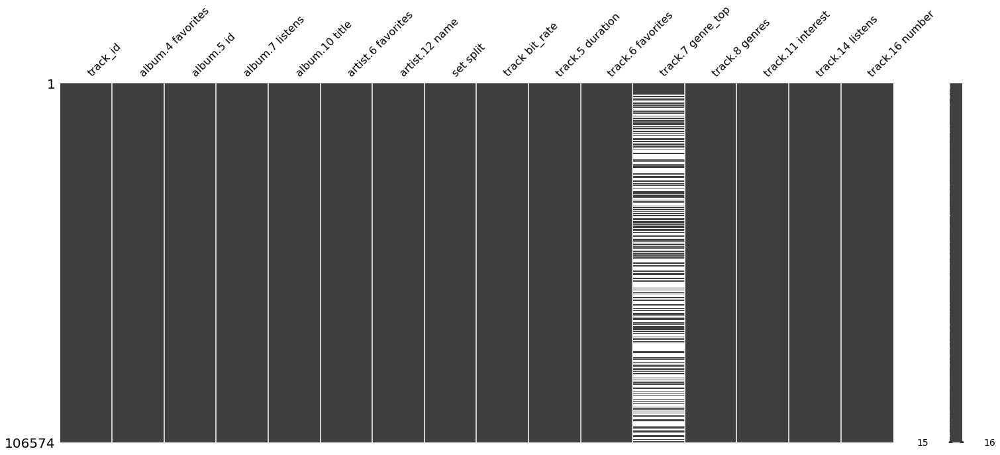

In [ ]:
ms.matrix(tracks)

In [ ]:
tracks['track.8 genres'].unique()

array(['[21]', '[10]', '[76, 103]', ..., '[17, 63, 1235]',
       '[42, 107, 183]', '[10, 12, 169]'], dtype=object)

In [ ]:
genres.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163 entries, 0 to 162
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   genre_id   163 non-null    int64 
 1   #tracks    163 non-null    int64 
 2   parent     163 non-null    int64 
 3   title      163 non-null    object
 4   top_level  163 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 6.5+ KB


In [ ]:
type(tracks['track.7 genre_top'].iloc[27])

str

In [ ]:
def getList(cd):
    return cd[1:-1].split(',')

In [ ]:
for i in range(0, 106574):
    if type(tracks['track.7 genre_top'][i]) == float:
        genre_list = getList(str(tracks['track.8 genres'][i]))
        count = len(genre_list)
        title = ""
        for j in range(0, count):
            title = title + str(genres['title'][j]) + str('|')
        tracks['track.7 genre_top'][i] = title

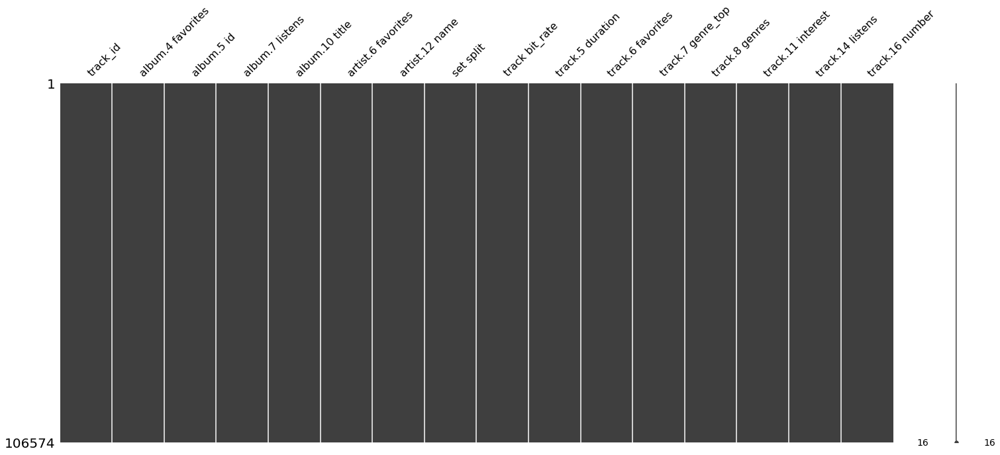

In [ ]:
ms.matrix(tracks)

In [ ]:
genres.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163 entries, 0 to 162
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   genre_id   163 non-null    int64 
 1   #tracks    163 non-null    int64 
 2   parent     163 non-null    int64 
 3   title      163 non-null    object
 4   top_level  163 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 6.5+ KB


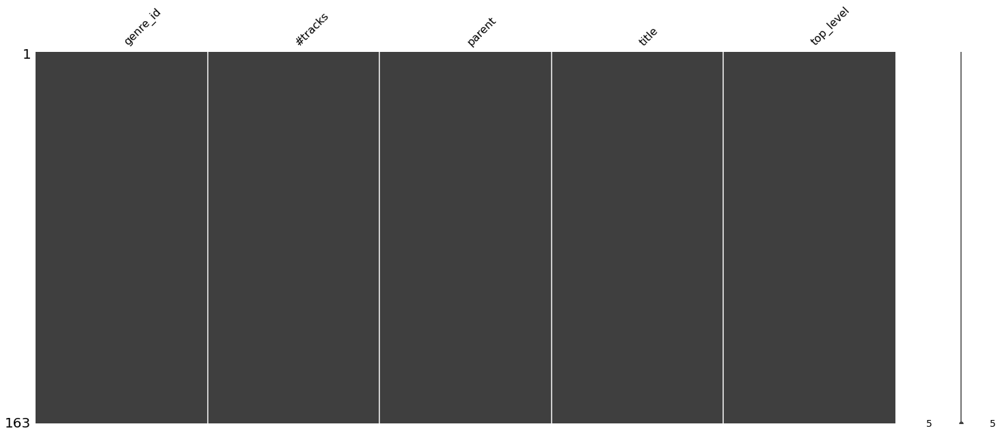

In [ ]:
ms.matrix(genres)

In [ ]:
genres.head()

,genre_id,#tracks,parent,title,top_level
0,1,8693,38,Avant-Garde,38
1,2,5271,0,International,2
2,3,1752,0,Blues,3
3,4,4126,0,Jazz,4
4,5,4106,0,Classical,5


In [ ]:
echonest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13129 entries, 0 to 13128
Columns: 240 entries, track_id to 223
dtypes: float64(237), object(3)
memory usage: 24.0+ MB


In [ ]:
tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106574 entries, 0 to 106573
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   track_id            106574 non-null  object
 1   album.4 favorites   106574 non-null  object
 2   album.5 id          106574 non-null  object
 3   album.7 listens     106574 non-null  object
 4   album.10 title      106574 non-null  object
 5   artist.6 favorites  106574 non-null  object
 6   artist.12 name      106574 non-null  object
 7   set split           106574 non-null  object
 8   track bit_rate      106574 non-null  object
 9   track.5 duration    106574 non-null  object
 10  track.6 favorites   106574 non-null  object
 11  track.7 genre_top   106574 non-null  object
 12  track.8 genres      106574 non-null  object
 13  track.11 interest   106574 non-null  object
 14  track.14 listens    106574 non-null  object
 15  track.16 number     106574 non-null  object
dtypes:

In [ ]:
tracks.head()

,track_id,album.4 favorites,album.5 id,album.7 listens,album.10 title,artist.6 favorites,artist.12 name,set split,track bit_rate,track.5 duration,track.6 favorites,track.7 genre_top,track.8 genres,track.11 interest,track.14 listens,track.16 number
0,2,4,1,6073,AWOL - A Way Of Life,9,AWOL,training,256000,168,2,Hip-Hop,[21],4656,1293,3
1,3,4,1,6073,AWOL - A Way Of Life,9,AWOL,training,256000,237,1,Hip-Hop,[21],1470,514,4
2,5,4,1,6073,AWOL - A Way Of Life,9,AWOL,training,256000,206,6,Hip-Hop,[21],1933,1151,6
3,10,4,6,47632,Constant Hitmaker,74,Kurt Vile,training,192000,161,178,Pop,[10],54881,50135,1
4,20,2,4,2710,Niris,10,Nicky Cook,training,256000,311,0,Avant-Garde|International|,"[76, 103]",978,361,3


In [ ]:
echonest.head()

1,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_name,release,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223
0,2,0.416675,0.675894,0.634476,0.010628,0.177647,0.159310,165.922,0.576661,AWOL,AWOL - A Way Of Life,0.388990,0.386740,0.406370,0.000000,0.000000,0.877233,0.588911,0.354243,0.295090,0.298413,0.309430,0.304496,0.334579,0.249495,0.259656,0.318376,0.371974,1.000,0.5710,0.278,0.2100,0.2150,0.2285,0.2375,0.279,0.1685,0.1685,0.279,0.3325,0.049848,0.104212,0.060230,0.052290,0.047403,0.052815,0.052733,0.062216,0.051613,0.057399,0.053199,0.062583,0.036,0.018,0.017,0.021,0.021,0.010,0.015,0.041,0.010,0.009,0.021,0.013,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.964,0.982,0.983,0.979,0.979,0.990,0.985,0.959,0.990,0.991,0.979,0.987,-1.899342,-0.032654,0.878469,1.147538,0.950856,0.948257,1.157887,1.147911,1.646318,1.530193,1.197568,0.745673,2.510038,-1.500183,0.030540,0.694242,0.170432,0.064695,0.874727,0.722576,2.251320,1.708159,1.054857,0.020675,42.949131,44.387436,32.409389,15.668667,10.114028,-4.069252,2.042353,2.188321,-3.805923,-0.494699,6.024670,10.692599,44.442501,42.388500,31.684999,9.987500,9.568501,-7.1485,3.8315,1.8505,-2.6875,-0.800,5.4615,10.2565,39.494820,1966.979126,1825.123047,1903.756714,828.810059,911.155823,581.015320,722.001404,404.682556,315.528473,376.632416,229.282547,0.000,-110.367996,-100.605003,-112.581001,-75.882004,-89.160004,-80.737999,-91.498001,-66.649002,-61.845001,-66.081001,-58.043999,52.006001,216.237000,208.423004,145.194000,97.482002,98.723000,68.091003,101.588997,69.505997,58.227001,69.262001,58.175999,52.006001,326.604980,309.028015,257.774994,173.364014,187.882996,148.829010,193.087006,136.154999,120.072006,135.343002,116.220001,-2.952152,0.060379,0.525976,0.365915,0.018182,0.454431,-0.330007,0.149395,-0.214859,0.030427,-0.153877,-0.150132,13.206213,1.009934,1.577194,0.337023,0.097149,0.401260,0.006324,0.643486,0.012059,0.237947,0.655938,1.213864,-12.486146,-11.2695,46.031261,-60.000000,-3.933,56.067001,-2.587475,11.802585,0.047970,0.038275,0.000988,0.00000,0.20730,0.20730,1.603659,2.984276,-21.812077,-20.312000,49.157482,-60.0,-9.691,50.308998,-1.992303,6.805694,0.233070,0.192880,0.027455,0.06408,3.67696,3.61288,13.316690,262.929749
1,3,0.374408,0.528643,0.817461,0.001851,0.105880,0.461818,126.957,0.269240,AWOL,AWOL - A Way Of Life,0.388990,0.386740,0.406370,0.000000,0.000000,0.534429,0.537414,0.443299,0.390879,0.344573,0.366448,0.419455,0.747766,0.460901,0.392379,0.474559,0.406729,0.506,0.5145,0.387,0.3235,0.2805,0.3135,0.3455,0.898,0.4365,0.3385,0.398,0.3480,0.079207,0.083319,0.073595,0.071024,0.056679,0.066113,0.073889,0.088100,0.071305,0.059275,0.088222,0.067298,0.040,0.040,0.029,0.021,0.009,0.020,0.020,0.053,0.022,0.032,0.034,0.028,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.960,0.960,0.971,0.979,0.991,0.980,0.980,0.947,0.978,0.968,0.966,0.972,0.197378,0.182772,0.608394,0.785822,0.773479,0.650546,0.574605,-0.767804,0.326266,0.808435,0.506893,0.682139,-1.157548,-1.170147,-0.683188,-0.366574,-0.245357,-0.5476

In [ ]:
genres.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163 entries, 0 to 162
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   genre_id   163 non-null    int64 
 1   #tracks    163 non-null    int64 
 2   parent     163 non-null    int64 
 3   title      163 non-null    object
 4   top_level  163 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 6.5+ KB


In [ ]:
genres.head()

,genre_id,#tracks,parent,title,top_level
0,1,8693,38,Avant-Garde,38
1,2,5271,0,International,2
2,3,1752,0,Blues,3
3,4,4126,0,Jazz,4
4,5,4106,0,Classical,5


In [ ]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106574 entries, 0 to 106573
Columns: 519 entries, feature track_id to zcr.6 std
dtypes: float64(518), int64(1)
memory usage: 422.0 MB


In [ ]:
features.head()

,feature track_id,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_cqt.62 skew,chroma_cqt.63 skew,chroma_cqt.64 skew,chroma_cqt.65 skew,chroma_cqt.66 skew,chroma_cqt.67 skew,chroma_cqt.68 skew,chroma_cqt.69 skew,chroma_cqt.70 skew,chroma_cqt.71 skew,chroma_cqt.72 std,chroma_cqt.73 std,chroma_cqt.74 std,chroma_cqt.75 std,chroma_cqt.76 std,chroma_cqt.77 std,chroma_cqt.78 std,chroma_cqt.79 std,chroma_cqt.80 std,chroma_cqt.81 std,chroma_cqt.82 std,chroma_cqt.83 std,chroma_stft kurtosis,chroma_stft.1 kurtosis,chroma_stft.2 kurtosis,chroma_stft.3 kurtosis,chroma_stft.4 kurtosis,chroma_stft.5 kurtosis,chroma_stft.6 kurtosis,chroma_stft.7 kurtosis,chroma_stft.8 kurtosis,chroma_stft.9 kurtosis,chroma_stft.10 kurtosis,chroma_stft.11 kurtosis,chroma_stft.12 max,chroma_stft.13 max,chroma_stft.14 max,chroma_stft.15 max,chroma_stft.16 max,chroma_stft.17 max,chroma_stft.18 max,chroma_stft.19 max,chroma_stft.20 max,chroma_stft.21 max,chroma_stft.22 max,chroma_stft.23 max,chroma_stft.24 mean,chroma_stft.25 mean,chroma_stft.26 mean,chroma_stft.27 mean,chroma_stft.28 mean,chroma_stft.29 mean,chroma_stft.30 mean,chroma_stft.31

In [ ]:
features.columns = ['track_id'] + list(features.columns[1:])

In [ ]:
features.head()

,track_id,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_cqt.62 skew,chroma_cqt.63 skew,chroma_cqt.64 skew,chroma_cqt.65 skew,chroma_cqt.66 skew,chroma_cqt.67 skew,chroma_cqt.68 skew,chroma_cqt.69 skew,chroma_cqt.70 skew,chroma_cqt.71 skew,chroma_cqt.72 std,chroma_cqt.73 std,chroma_cqt.74 std,chroma_cqt.75 std,chroma_cqt.76 std,chroma_cqt.77 std,chroma_cqt.78 std,chroma_cqt.79 std,chroma_cqt.80 std,chroma_cqt.81 std,chroma_cqt.82 std,chroma_cqt.83 std,chroma_stft kurtosis,chroma_stft.1 kurtosis,chroma_stft.2 kurtosis,chroma_stft.3 kurtosis,chroma_stft.4 kurtosis,chroma_stft.5 kurtosis,chroma_stft.6 kurtosis,chroma_stft.7 kurtosis,chroma_stft.8 kurtosis,chroma_stft.9 kurtosis,chroma_stft.10 kurtosis,chroma_stft.11 kurtosis,chroma_stft.12 max,chroma_stft.13 max,chroma_stft.14 max,chroma_stft.15 max,chroma_stft.16 max,chroma_stft.17 max,chroma_stft.18 max,chroma_stft.19 max,chroma_stft.20 max,chroma_stft.21 max,chroma_stft.22 max,chroma_stft.23 max,chroma_stft.24 mean,chroma_stft.25 mean,chroma_stft.26 mean,chroma_stft.27 mean,chroma_stft.28 mean,chroma_stft.29 mean,chroma_stft.30 mean,chroma_stft.31 mean,ch

In [ ]:
features.head()

,track_id,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_cqt.62 skew,chroma_cqt.63 skew,chroma_cqt.64 skew,chroma_cqt.65 skew,chroma_cqt.66 skew,chroma_cqt.67 skew,chroma_cqt.68 skew,chroma_cqt.69 skew,chroma_cqt.70 skew,chroma_cqt.71 skew,chroma_cqt.72 std,chroma_cqt.73 std,chroma_cqt.74 std,chroma_cqt.75 std,chroma_cqt.76 std,chroma_cqt.77 std,chroma_cqt.78 std,chroma_cqt.79 std,chroma_cqt.80 std,chroma_cqt.81 std,chroma_cqt.82 std,chroma_cqt.83 std,chroma_stft kurtosis,chroma_stft.1 kurtosis,chroma_stft.2 kurtosis,chroma_stft.3 kurtosis,chroma_stft.4 kurtosis,chroma_stft.5 kurtosis,chroma_stft.6 kurtosis,chroma_stft.7 kurtosis,chroma_stft.8 kurtosis,chroma_stft.9 kurtosis,chroma_stft.10 kurtosis,chroma_stft.11 kurtosis,chroma_stft.12 max,chroma_stft.13 max,chroma_stft.14 max,chroma_stft.15 max,chroma_stft.16 max,chroma_stft.17 max,chroma_stft.18 max,chroma_stft.19 max,chroma_stft.20 max,chroma_stft.21 max,chroma_stft.22 max,chroma_stft.23 max,chroma_stft.24 mean,chroma_stft.25 mean,chroma_stft.26 mean,chroma_stft.27 mean,chroma_stft.28 mean,chroma_stft.29 mean,chroma_stft.30 mean,chroma_stft.31 mean,ch

In [ ]:
type(echonest['track_id'].iloc[0])

str

In [ ]:
echonest['track_id'] = echonest['track_id'].astype('int')
tracks['track_id'] = tracks['track_id'].astype('int')

In [ ]:
features.sort_values(by='track_id', inplace=True)
tracks.sort_values(by='track_id', inplace=True)
echonest.sort_values(by='track_id', inplace=True)

In [ ]:
features.head()

,track_id,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_cqt.62 skew,chroma_cqt.63 skew,chroma_cqt.64 skew,chroma_cqt.65 skew,chroma_cqt.66 skew,chroma_cqt.67 skew,chroma_cqt.68 skew,chroma_cqt.69 skew,chroma_cqt.70 skew,chroma_cqt.71 skew,chroma_cqt.72 std,chroma_cqt.73 std,chroma_cqt.74 std,chroma_cqt.75 std,chroma_cqt.76 std,chroma_cqt.77 std,chroma_cqt.78 std,chroma_cqt.79 std,chroma_cqt.80 std,chroma_cqt.81 std,chroma_cqt.82 std,chroma_cqt.83 std,chroma_stft kurtosis,chroma_stft.1 kurtosis,chroma_stft.2 kurtosis,chroma_stft.3 kurtosis,chroma_stft.4 kurtosis,chroma_stft.5 kurtosis,chroma_stft.6 kurtosis,chroma_stft.7 kurtosis,chroma_stft.8 kurtosis,chroma_stft.9 kurtosis,chroma_stft.10 kurtosis,chroma_stft.11 kurtosis,chroma_stft.12 max,chroma_stft.13 max,chroma_stft.14 max,chroma_stft.15 max,chroma_stft.16 max,chroma_stft.17 max,chroma_stft.18 max,chroma_stft.19 max,chroma_stft.20 max,chroma_stft.21 max,chroma_stft.22 max,chroma_stft.23 max,chroma_stft.24 mean,chroma_stft.25 mean,chroma_stft.26 mean,chroma_stft.27 mean,chroma_stft.28 mean,chroma_stft.29 mean,chroma_stft.30 mean,chroma_stft.31 mean,ch

In [ ]:
tracks.head()

,track_id,album.4 favorites,album.5 id,album.7 listens,album.10 title,artist.6 favorites,artist.12 name,set split,track bit_rate,track.5 duration,track.6 favorites,track.7 genre_top,track.8 genres,track.11 interest,track.14 listens,track.16 number
0,2,4,1,6073,AWOL - A Way Of Life,9,AWOL,training,256000,168,2,Hip-Hop,[21],4656,1293,3
1,3,4,1,6073,AWOL - A Way Of Life,9,AWOL,training,256000,237,1,Hip-Hop,[21],1470,514,4
2,5,4,1,6073,AWOL - A Way Of Life,9,AWOL,training,256000,206,6,Hip-Hop,[21],1933,1151,6
3,10,4,6,47632,Constant Hitmaker,74,Kurt Vile,training,192000,161,178,Pop,[10],54881,50135,1
4,20,2,4,2710,Niris,10,Nicky Cook,training,256000,311,0,Avant-Garde|International|,"[76, 103]",978,361,3


In [ ]:
count = 0
for i in range(0, 106574):
    if features['track_id'][i] == tracks['track_id'][i]:
        count += 1
    else:
        print(features['track_id'][i], tracks['track_id'][i])

In [ ]:
final = pd.concat([features, tracks.drop('track_id', axis=1)], axis=1)


In [ ]:
final.shape

(106574, 534)

In [ ]:
final.head()

,track_id,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_cqt.62 skew,chroma_cqt.63 skew,chroma_cqt.64 skew,chroma_cqt.65 skew,chroma_cqt.66 skew,chroma_cqt.67 skew,chroma_cqt.68 skew,chroma_cqt.69 skew,chroma_cqt.70 skew,chroma_cqt.71 skew,chroma_cqt.72 std,chroma_cqt.73 std,chroma_cqt.74 std,chroma_cqt.75 std,chroma_cqt.76 std,chroma_cqt.77 std,chroma_cqt.78 std,chroma_cqt.79 std,chroma_cqt.80 std,chroma_cqt.81 std,chroma_cqt.82 std,chroma_cqt.83 std,chroma_stft kurtosis,chroma_stft.1 kurtosis,chroma_stft.2 kurtosis,chroma_stft.3 kurtosis,chroma_stft.4 kurtosis,chroma_stft.5 kurtosis,chroma_stft.6 kurtosis,chroma_stft.7 kurtosis,chroma_stft.8 kurtosis,chroma_stft.9 kurtosis,chroma_stft.10 kurtosis,chroma_stft.11 kurtosis,chroma_stft.12 max,chroma_stft.13 max,chroma_stft.14 max,chroma_stft.15 max,chroma_stft.16 max,chroma_stft.17 max,chroma_stft.18 max,chroma_stft.19 max,chroma_stft.20 max,chroma_stft.21 max,chroma_stft.22 max,chroma_stft.23 max,chroma_stft.24 mean,chroma_stft.25 mean,chroma_stft.26 mean,chroma_stft.27 mean,chroma_stft.28 mean,chroma_stft.29 mean,chroma_stft.30 mean,chroma_stft.31 mean,ch

In [ ]:
echonest.tail(3)

1,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_name,release,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223
13126,124863,0.000124,0.609686,0.895136,0.846624,0.632903,0.051517,129.996,0.496667,Basic,Do You Know The Word,0.430808,0.456871,0.486749,0.000000,0.000000,0.842368,0.719091,0.351503,0.354707,0.314619,0.276266,0.340571,0.342762,0.449963,0.456690,0.525160,0.379067,0.9410,0.7365,0.322,0.313,0.272,0.216,0.2810,0.2815,0.391,0.3980,0.494,0.2300,0.042071,0.053089,0.053503,0.062070,0.046892,0.044217,0.058615,0.059589,0.083619,0.087591,0.106185,0.116124,0.057,0.061,0.015,0.012,0.006,0.006,0.019,0.012,0.020,0.017,0.023,0.006,1.0,1.0,1.000,1.0,1.000,1.0,1.000,1.0,1.0,1.000,1.0,1.0,0.943,0.939,0.985,0.988,0.994,0.994,0.981,0.988,0.980,0.983,0.977,0.994,-1.306093,-0.427339,0.662190,0.897117,1.033409,1.233316,1.101503,1.041309,0.352317,0.336257,0.083344,0.607673,0.848189,-0.779476,-0.153455,0.236375,0.697419,1.207446,0.574102,0.374672,-1.179828,-1.219911,-1.464969,-1.150764,46.574032,19.885004,-27.238619,14.896728,8.818023,-46.983776,6.224150,1.460417,-9.967053,1.662893,-8.898413,-2.671768,47.124496,29.164499,-30.208500,8.6565,6.062000,-47.362000,6.056,3.3375,-9.975500,0.8075,-8.6295,-3.170,24.414362,2173.843750,3050.146240,1098.362427,701.321960,698.485657,364.898224,366.970856,198.949478,229.595428,209.352036,110.002777,1.600,-237.076996,-159.192993,-98.862999,-53.324001,-121.438004,-55.490002,-76.160004,-67.515999,-68.608002,-94.983002,-34.882999,55.021999,236.968002,222.106003,201.757996,146.037994,86.358002,67.710999,94.129997,47.946999,80.769997,45.280998,38.556999,53.422001,474.044983,381.299011,300.621002,199.362000,207.796005,123.201004,170.290009,115.462997,149.377991,140.264008,73.440002,-1.328422,-1.292708,0.512491,0.708971,1.408381,0.367603,0.025204,-0.602542,0.028483,0.510469,-0.620085,0.131534,6.450247,4.479912,0.615974,1.415341,4.096390,1.093365,-0.206154,1.746544,0.559263,1.698776,2.477646,0.512601,-9.183863,-8.528,22.383396,-57.069,-2.212,54.857002,-1.961082,10.309643,0.027183,0.020315,0.000572,0.00160,0.30417,0.30257,3.510331,19.698879,-18.732578,-18.153000,38.714157,-58.957001,-6.727,52.230000,-0.771613,1.623510,0.180471,0.128185,0.010103,0.06222,2.251160,2.18894,5.578341,89.180328
13127,124864,0.327576,0.574426,0.548327,0.452867,0.075928,0.033388,142.009,0.569274,Basic,Do You Know The Word,0.430808,0.456871,0.486749,0.000000,0.000000,0.346748,0.311817,0.220864,0.185269,0.333642,0.290699,0.558345,0.397021,0.217570,0.297939,0.282145,0.448469,0.2665,0.2060,0.148,0.130,0.191,0.242,0.5025,0.2730,0.144,0.1925,0.200,0.3235,0.076872,0.076511,0.042258,0.030182,0.103753,0.044950,0.128948,0.114917,0.046146,0.082257,0.062730,0.120529,0.007,0.009,0.006,0.007,0.005,0.008,0.019,0.007,0.005,0.004,0.004,0.004,1.0,1.0,1.000,1.0,1.000,1.0,1.000,1.0,1.0,1.000,1.0,1.0,0.993,0.991,0.994,0.993,0.995,0.992,0.981,0.993,0.995,0.996,0.996,0.996,0.800296,1.372972,1.798896,2.094615,1.152172,1.097721,0.081656,0.756757,1.712226,1.291547,1.429432,0.555801,-0.415999,0.860412,3

In [ ]:
echonest.drop(['artist_name', 'release'], axis=1, inplace=True)

In [ ]:
tracks.tail(3)

,track_id,album.4 favorites,album.5 id,album.7 listens,album.10 title,artist.6 favorites,artist.12 name,set split,track bit_rate,track.5 duration,track.6 favorites,track.7 genre_top,track.8 genres,track.11 interest,track.14 listens,track.16 number
106571,155318,0,22940,1506,"Live at Monty Hall, 2/17/2017",0,Spowder,training,320000,404,2,Rock,[25],214,168,6
106572,155319,0,22940,1506,"Live at Monty Hall, 2/17/2017",0,Spowder,training,320000,146,0,Rock,[25],336,294,5
106573,155320,1,22906,7481,What I Tell Myself Vol. 2,12,Forget the Whale,validation,320000,198,1,Avant-Garde|International|Blues|,"[10, 12, 169]",972,705,7


In [ ]:
features.head(1)

,track_id,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_cqt.62 skew,chroma_cqt.63 skew,chroma_cqt.64 skew,chroma_cqt.65 skew,chroma_cqt.66 skew,chroma_cqt.67 skew,chroma_cqt.68 skew,chroma_cqt.69 skew,chroma_cqt.70 skew,chroma_cqt.71 skew,chroma_cqt.72 std,chroma_cqt.73 std,chroma_cqt.74 std,chroma_cqt.75 std,chroma_cqt.76 std,chroma_cqt.77 std,chroma_cqt.78 std,chroma_cqt.79 std,chroma_cqt.80 std,chroma_cqt.81 std,chroma_cqt.82 std,chroma_cqt.83 std,chroma_stft kurtosis,chroma_stft.1 kurtosis,chroma_stft.2 kurtosis,chroma_stft.3 kurtosis,chroma_stft.4 kurtosis,chroma_stft.5 kurtosis,chroma_stft.6 kurtosis,chroma_stft.7 kurtosis,chroma_stft.8 kurtosis,chroma_stft.9 kurtosis,chroma_stft.10 kurtosis,chroma_stft.11 kurtosis,chroma_stft.12 max,chroma_stft.13 max,chroma_stft.14 max,chroma_stft.15 max,chroma_stft.16 max,chroma_stft.17 max,chroma_stft.18 max,chroma_stft.19 max,chroma_stft.20 max,chroma_stft.21 max,chroma_stft.22 max,chroma_stft.23 max,chroma_stft.24 mean,chroma_stft.25 mean,chroma_stft.26 mean,chroma_stft.27 mean,chroma_stft.28 mean,chroma_stft.29 mean,chroma_stft.30 mean,chroma_stft.31 mean,ch

In [ ]:
final = echonest.merge(final, on='track_id')

In [ ]:
final.shape

(13129, 771)

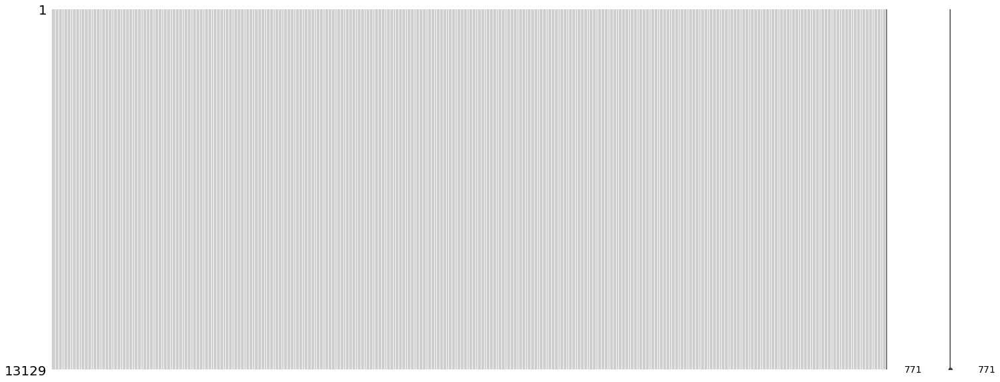

In [ ]:
ms.matrix(final)

In [ ]:
final.head()

,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_

In [ ]:
final.shape

(13129, 771)

In [ ]:
final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13129 entries, 0 to 13128
Columns: 771 entries, track_id to track.16 number
dtypes: float64(755), int64(1), object(15)
memory usage: 77.3+ MB


In [ ]:
final.drop('track.8 genres', axis=1, inplace=True)

In [ ]:
final.shape

(13129, 770)

In [ ]:
final.head()

,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_

In [ ]:
final['track.7 genre_top'].value_counts()

Rock                                                       3892
Electronic                                                 2170
Avant-Garde|International|                                 1902
Avant-Garde|International|Blues|                           1507
Hip-Hop                                                     910
Folk                                                        874
Old-Time / Historic                                         357
Pop                                                         346
Avant-Garde|International|Blues|Jazz|                       269
Classical                                                   265
Jazz                                                        241
International                                               133
Instrumental                                                 84
Avant-Garde|International|Blues|Jazz|Classical|              82
Blues                                                        66
Experimental                            

In [ ]:
def format_strings(x):
    if '-' in x:
        return ''.join(x.split('-'))
    if x.find('/'):
        return '|'.join(x.split('/'))
    return x

In [ ]:
def modifyString(serie, val):
    for i in range(0, val):
        if serie[i] == 'Old-Time / Historic':
            serie[i] = 'OldTime|Historic'
    return serie


In [ ]:
final['track.7 genre_top'] = modifyString(final['track.7 genre_top'], 13129)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [ ]:
final['track.7 genre_top'] = final['track.7 genre_top'].apply(format_strings)

In [ ]:
final['track.7 genre_top'].value_counts()

Rock                                                      3892
Electronic                                                2170
AvantGarde|International|                                 1902
AvantGarde|International|Blues|                           1507
HipHop                                                     910
Folk                                                       874
OldTime|Historic                                           357
Pop                                                        346
AvantGarde|International|Blues|Jazz|                       269
Classical                                                  265
Jazz                                                       241
International                                              133
Instrumental                                                84
AvantGarde|International|Blues|Jazz|Classical|              82
Blues                                                       66
Experimental                                           

In [ ]:
final.head()

,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_

In [ ]:
metadata = pd.DataFrame()

In [ ]:
metadata['track_id'] = final['track_id']

In [ ]:
metadata.shape

(13129, 1)

In [ ]:
track_title.shape

(106574, 2)

In [ ]:
track_title = track_title.set_index('track_id')

In [ ]:
track_title.head()

,track.19 title
track_id,
2,Food
3,Electric Ave
5,This World
10,Freeway
20,Spiritual Level


In [ ]:
track_title.index = [int(i) for i in track_title.index]

In [ ]:
track_title.head()

,track.19 title
2,Food
3,Electric Ave
5,This World
10,Freeway
20,Spiritual Level


In [ ]:
metadata.head()

,track_id
0,2
1,3
2,5
3,10
4,134


In [ ]:
metadata['album_title'] = final['album.10 title']

In [ ]:
metadata['artist_name'] = final['artist.12 name']

In [ ]:
metadata['genre'] = final['track.7 genre_top']

In [ ]:
metadata = metadata.set_index('track_id')

In [ ]:
metadata.tail()

,album_title,artist_name,genre
track_id,,,
124857,Do You Know The Word,BASIC,AvantGarde|International|
124862,Do You Know The Word,BASIC,AvantGarde|International|
124863,Do You Know The Word,BASIC,AvantGarde|International|
124864,Do You Know The Word,BASIC,AvantGarde|International|
124911,Suicide Beauty Girl,Yusuke Tsutsumi,AvantGarde|International|


In [ ]:
metadata.head()

,album_title,artist_name,genre
track_id,,,
2,AWOL - A Way Of Life,AWOL,HipHop
3,AWOL - A Way Of Life,AWOL,HipHop
5,AWOL - A Way Of Life,AWOL,HipHop
10,Constant Hitmaker,Kurt Vile,Pop
134,AWOL - A Way Of Life,AWOL,HipHop


In [ ]:
metadata['track_title'] = track_title.loc[metadata.index]['track.19 title']

In [ ]:
metadata.tail()

,album_title,artist_name,genre,track_title
track_id,,,,
124857,Do You Know The Word,BASIC,AvantGarde|International|,I'm Wearing My Dancing Pants
124862,Do You Know The Word,BASIC,AvantGarde|International|,Me Funky You Jane
124863,Do You Know The Word,BASIC,AvantGarde|International|,Ain't Mad at Ya
124864,Do You Know The Word,BASIC,AvantGarde|International|,This Is Not the End
124911,Suicide Beauty Girl,Yusuke Tsutsumi,AvantGarde|International|,Heaven


In [ ]:
len(metadata[metadata['genre'].isnull()])

0

In [ ]:
final.drop('album.10 title', axis=1, inplace=True)

In [ ]:
final.head()


,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_

In [ ]:
final.drop('artist.12 name', axis=1, inplace=True)

In [ ]:
final.head()

,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_

In [ ]:
k = final

In [ ]:
final.head()

,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_

In [ ]:
final.drop('set split', axis=1, inplace=True)

In [ ]:
genres['title'].count()

163

In [ ]:
genre_dummy = pd.DataFrame(data= np.zeros((13129, 163)), columns= list(genres['title'].unique()))

In [ ]:
genre_dummy.head()

,Avant-Garde,International,Blues,Jazz,Classical,Novelty,Comedy,Old-Time / Historic,Country,Pop,Disco,Rock,Easy Listening,Soul-RnB,Electronic,Sound Effects,Folk,Soundtrack,Funk,Spoken,Hip-Hop,Audio Collage,Punk,Post-Rock,Lo-Fi,Field Recordings,Metal,Noise,Psych-Folk,Krautrock,Jazz: Vocal,Experimental,Electroacoustic,Ambient Electronic,Radio Art,Loud-Rock,Latin America,Drone,Free-Folk,Noise-Rock,Psych-Rock,Bluegrass,Electro-Punk,Radio,Indie-Rock,Industrial,No Wave,Free-Jazz,Experimental Pop,French,Reggae - Dub,Afrobeat,Nerdcore,Garage,Indian,New Wave,Post-Punk,Sludge,African,Freak-Folk,Jazz: Out,Progressive,Alternative Hip-Hop,Death-Metal,Middle East,Singer-Songwriter,Ambient,Hardcore,Power-Pop,Space-Rock,Polka,Balkan,Unclassifiable,Europe,Americana,Spoken Weird,Interview,Black-Metal,Rockabilly,Easy Listening: Vocal,Brazilian,Asia-Far East,N. Indian Traditional,South Indian Traditional,Bollywood,Pacific,Celtic,Be-Bop,Big Band/Swing,British Folk,Techno,House,Glitch,Minimal Electronic,Breakcore - Hard,Sound Poetry,20th Century Classical,Poetry,Talk Radio,North African,Sound Collage,Flamenco,IDM,Chiptune,Musique Concrete,Improv,New Age,Trip-Hop,Dance,Chip Music,Lounge,Goth,Composed Music,Drum & Bass,Shoegaze,Kid-Friendly,Thrash,Synth Pop,Banter,Deep Funk,Spoken Word,Chill-out,Bigbeat,Surf,Radio Theater,Grindcore,Rock Opera,Opera,Chamber Music,Choral Music,Symphony,Minimalism,Musical Theater,Dubstep,Skweee,Western Swing,Downtempo,Cumbia,Latin,Sound Art,Romany (Gypsy),Compilation,Rap,Breakbeat,Gospel,Abstract Hip-Hop,Reggae - Dancehall,Spanish,Country & Western,Contemporary Classical,Wonky,Jungle,Klezmer,Holiday,Salsa,Nu-Jazz,Hip-Hop Beats,Modern Jazz,Turkish,Tango,Fado,Christmas,Instrumental
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [ ]:
genre_list = pd.Series(data= genre_dummy.columns)

In [ ]:
genre_list = modifyString(genre_list, 163)

In [ ]:
genre_list

0                   Avant-Garde
1                 International
2                         Blues
3                          Jazz
4                     Classical
5                       Novelty
6                        Comedy
7              OldTime|Historic
8                       Country
9                           Pop
10                        Disco
11                         Rock
12               Easy Listening
13                     Soul-RnB
14                   Electronic
15                Sound Effects
16                         Folk
17                   Soundtrack
18                         Funk
19                       Spoken
20                      Hip-Hop
21                Audio Collage
22                         Punk
23                    Post-Rock
24                        Lo-Fi
25             Field Recordings
26                        Metal
27                        Noise
28                   Psych-Folk
29                    Krautrock
30                  Jazz: Vocal
31      

In [ ]:
genre_list = genre_list.apply(format_strings)

In [ ]:
genre_dummy.columns= genre_list

In [ ]:
genre_list = list(genre_list)

In [ ]:
final

track_id  acousticness  danceability    energy  instrumentalness  \
0             2      0.416675      0.675894  0.634476          0.010628   
1             3      0.374408      0.528643  0.817461          0.001851   
2             5      0.043567      0.745566  0.701470          0.000697   
3            10      0.951670      0.658179  0.924525          0.965427   
4           134      0.452217      0.513238  0.560410          0.019443   
...         ...           ...           ...       ...               ...   
13124    124857      0.007592      0.790364  0.719288          0.853114   
13125    124862      0.041498      0.843077  0.536496          0.865151   
13126    124863      0.000124      0.609686  0.895136          0.846624   
13127    124864      0.327576      0.574426  0.548327          0.452867   
13128    124911      0.993606      0.499339  0.050622          0.945677   

       liveness  speechiness    tempo   valence  artist_discovery  \
0      0.177647     0.159310  165.922  0.576661          0.388990   
1      0.105880     0.461818  126.957  0.269240          0.388990   
2      0.373143     0.124595  100.260  0.621661          0.388990   
3      0.115474     0.032985  111.562  0.963590          0.557339   
4      0.096567     0.525519  114.290  0.894072          0.388990   
...         ...          ...      ...       ...               ...   
13124  0.720715     0.082550  141.332  0.890461          0.430808   
13125  0.547949     0.074001  101.975  0.476845          0.430808   
13126  0.632903     0.051517  129.996  0.496667          0.430808   
13127  0.075928     0.033388  142.009  0.569274          0.430808   
13128  0.095965     0.065189  119.965  0.204652          0.450229   

       artist_familiarity  artist_hotttnesss  song_currency  song_hotttnesss  \
0                0.386740           0.406370       0.000000         0.000000   
1                0.386740           0.406370       0.000000         0.000000   
2                0.386740           0.406370       0.000000         0.000000   
3                0.614272           0.798387       0.005158         0.354516   
4                0.386740           0.406370       0.000000         0.000000   
...                   ...                ...            ...              ...   
13124            0.456871           0.486749       0.000000         0.000000   
13125            0.456871           0.486749       0.000000         0.000000   
13126            0.456871           0.486749       0.000000         0.000000   
13127            0.456871           0.486749       0.000000         0.000000   
13128            0.274787           0.470345       0.000061         0.068649   

            000       001       002       003       004       005       006  \
0      0.877233  0.588911  0.354243  0.295090  0.298413  0.309430  0.304496   
1      0.534429  0.537414  0.443299  0.390879  0.344573  0.366448  0.419455   
2      0.548093  0.720192  0.389257  0.344934  0.361300  0.402543  0.434044   
3      0.311404  0.711402  0.321914  0.500601  0.250963  0.321316  0.734250   
4      0.610849  0.569169  0.428494  0.345796  0.376920  0.460590  0.401371   
...         ...       ...       ...       ...       ...       ...       ...   
13124  0.717013  0.686557  0.411056  0.342718  0.341934  0.482926  0.419219   
13125  0.673395  0.846995  0.447772  0.425936  0.407817  0.405924  0.290565   
13126  0.842368  0.719091  0.351503  0.354707  0.314619  0.276266  0.340571   
13127  0.346748  0.311817  0.220864  0.185269  0.333642  0.290699  0.558345   
13128  0.319693  0.164967  0.071792  0.426253  0.068991  0.226611  0.076166   

            007       008       009       010       011     012     013  \
0      0.334579  0.249495  0.259656  0.318376  0.371974  1.0000  0.5710   
1      0.747766  0.460901  0.392379  0.474559  0.406729  0.5060  0.5145   
2      0.388137  0.512487  0.525755  0.425371  0.446896  0.5110  0.7720   
3      0.325188  0.373012  0.235840  0.368756  0.440775  0.2630  0.

In [ ]:
for i in range(0, 13129):
    if '|' in final['track.7 genre_top'][i]:
        divided_list = str(final['track.7 genre_top'][i]).split('|')
        count = len(divided_list)
        for j in range(0, count):
            if divided_list[j] in genre_list:
                location = genre_list.index(divided_list[j])
                genre_dummy.iloc[i, location] = 1
    else:
        location = genre_list.index(final['track.7 genre_top'][i])
        genre_dummy.iloc[i, location] = 1

In [ ]:
genre_list.index(final['track.7 genre_top'][0])

20

In [ ]:
final.drop(['track.7 genre_top'], axis= 1, inplace= True)

In [ ]:
final = pd.concat([final, genre_dummy], axis= 1)

In [ ]:
final.head()

,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 skew,chroma_

In [ ]:
import os

if not os.path.isdir(os.path.join('datasets','final')):
    os.makedirs(os.path.join('datasets','final'))
    
metadata.to_csv('datasets/final/metadata.csv')
final.to_csv('datasets/final/final.csv')

In [ ]:
final = pd.read_csv('datasets/final/final.csv')
metadata = pd.read_csv('datasets/final/metadata.csv')

In [ ]:
from sklearn.cluster import KMeans
from sklearn.utils import shuffle

In [ ]:
final = shuffle(final)

In [ ]:
X = final.loc[[i for i in range(0, 6000)]]
Y = final.loc[[i for i in range(6000, final.shape[0])]]

In [ ]:
Y

Unnamed: 0  track_id  acousticness  danceability    energy  \
6000         6000     24416      0.603645      0.454120  0.312400   
6001         6001     24419      0.075357      0.360356  0.603370   
6002         6002     24421      0.223757      0.384280  0.457154   
6003         6003     24422      0.897625      0.798376  0.334164   
6004         6004     24423      0.051234      0.230857  0.624570   
...           ...       ...           ...           ...       ...   
13124       13124    124857      0.007592      0.790364  0.719288   
13125       13125    124862      0.041498      0.843077  0.536496   
13126       13126    124863      0.000124      0.609686  0.895136   
13127       13127    124864      0.327576      0.574426  0.548327   
13128       13128    124911      0.993606      0.499339  0.050622   

       instrumentalness  liveness  speechiness    tempo   valence  \
6000           0.887912  0.244795     0.030779  108.211  0.244501   
6001           0.809924  0.127183     0.071755   65.858  0.565194   
6002           0.972268  0.122869     0.035158  110.878  0.275488   
6003           0.957161  0.116391     0.039380   83.035  0.715166   
6004           0.936658  0.134848     0.047154   89.624  0.570808   
...                 ...       ...          ...      ...       ...   
13124          0.853114  0.720715     0.082550  141.332  0.890461   
13125          0.865151  0.547949     0.074001  101.975  0.476845   
13126          0.846624  0.632903     0.051517  129.996  0.496667   
13127          0.452867  0.075928     0.033388  142.009  0.569274   
13128          0.945677  0.095965     0.065189  119.965  0.204652   

       artist_discovery  artist_familiarity  artist_hotttnesss  song_currency  \
6000           0.226028            0.184868           0.236127       0.000000   
6001           0.321546            0.286968           0.335913       0.000000   
6002           0.321546            0.286968           0.335913       0.000000   
6003           0.321546            0.286968           0.335913       0.000000   
6004           0.321546            0.286968           0.335913       0.000000   
...                 ...                 ...                ...            ...   
13124          0.430808            0.456871           0.486749       0.000000   
13125          0.430808            0.456871           0.486749       0.000000   
13126          0.430808            0.456871           0.486749       0.000000   
13127          0.430808            0.456871           0.486749       0.000000   
13128          0.450229            0.274787           0.470345       0.000061   

       song_hotttnesss       000       001       002       003       004  \
6000          0.000000  0.350803  0.276715  0.303310  0.313588  0.267252   
6001          0.000000  0.331877  0.425469  0.326654  0.596931  0.533384   
6002          0.000000  0.427889  0.492504  0.220876  0.239817  0.340131   
6003          0.000000  0.225390  0.354948  0.341026  0.184059  0.325340   
6004          0.000000  0.662180  0.654305  0.498338  0.329433  0.333150   
...                ...       ...       ...       ...       ...       ...   
13124         0.000000  0.717013  0.686557  0.411056  0.342718  0.341934   
13125         0.000000  0.673395  0.846995  0.447772  0.425936  0.407817   
13126         0.000000  0.842368  0.719091  0.351503  0.354707  0.314619   
13127         0.000000  0.346748  0.311817  0.220864  0.185269  0.333642   
13128         0.068649  0.319693  0.164967  0.071792  0.426253  0.068991   

            005       006       007       008       009       010       011  \
6000   0.196718  0.192317  0.387439  0.311352  0.277073  0.244891  0.172729   
6001   0.592631  0.446192  0.314362  0.206138  0.222162  0.223715  0.217315   
6002   0.602905  0.383661  0.256559  0.129963  0.174062  0.062515  0.074276   
6003   0.306364  0.479636  0.327298  0.217941  0.339329  0.158019  0.120772   
6004   0.287622  0.257475  0.294626  0.334644  0.442349  0.336200  0

In [ ]:
Y.shape[0]

7129

In [ ]:
final.shape

(13129, 930)

In [ ]:
final.shape[0]

13129

In [ ]:
X = shuffle(X)
Y = shuffle(Y)

In [ ]:
metadata.head()

,track_id,album_title,artist_name,genre,track_title
0,2,AWOL - A Way Of Life,AWOL,HipHop,Food
1,3,AWOL - A Way Of Life,AWOL,HipHop,Electric Ave
2,5,AWOL - A Way Of Life,AWOL,HipHop,This World
3,10,Constant Hitmaker,Kurt Vile,Pop,Freeway
4,134,AWOL - A Way Of Life,AWOL,HipHop,Street Music


In [ ]:
metadata = metadata.set_index('track_id')

In [ ]:
metadata.head()

,album_title,artist_name,genre,track_title
track_id,,,,
2,AWOL - A Way Of Life,AWOL,HipHop,Food
3,AWOL - A Way Of Life,AWOL,HipHop,Electric Ave
5,AWOL - A Way Of Life,AWOL,HipHop,This World
10,Constant Hitmaker,Kurt Vile,Pop,Freeway
134,AWOL - A Way Of Life,AWOL,HipHop,Street Music


In [ ]:
X

Unnamed: 0  track_id  acousticness  danceability    energy  \
4956        4956     19660      0.762820      0.295640  0.545399   
5785        5785     23410      0.911822      0.555612  0.908536   
4945        4945     19643      0.016963      0.307266  0.960533   
2252        2252      8513      0.472664      0.271211  0.645726   
3719        3719     14666      0.000272      0.625194  0.919799   
...          ...       ...           ...           ...       ...   
3519        3519     14059      0.995796      0.194220  0.233228   
2777        2777     11630      0.087909      0.149540  0.838166   
3901        3901     15483      0.223926      0.512474  0.334843   
3342        3342     13327      0.001824      0.166655  0.726906   
5432        5432     21522      0.318081      0.514783  0.530176   

      instrumentalness  liveness  speechiness    tempo   valence  \
4956          0.917023  0.070272     0.044121  146.541  0.451599   
5785          0.956044  0.078374     0.097804  119.046  0.845729   
4945          0.264078  0.101420     0.327795   76.059  0.117428   
2252          0.908373  0.275663     0.036334  149.680  0.193471   
3719          0.799891  0.162151     0.050025  133.761  0.743996   
...                ...       ...          ...      ...       ...   
3519          0.970252  0.090959     0.034636   82.026  0.039396   
2777          0.968048  0.125151     0.065003   99.804  0.114176   
3901          0.000000  0.156629     0.473105   92.011  0.568609   
3342          0.181085  0.136959     0.052735   92.542  0.137139   
5432          0.823859  0.113177     0.037541  123.988  0.412752   

      artist_discovery  artist_familiarity  artist_hotttnesss  song_currency  \
4956          0.448825            0.351283           0.468879       0.000198   
5785          0.252248            0.254184           0.263518       0.000000   
4945          0.296905            0.207552           0.310171       0.000025   
2252          0.401643            0.352017           0.419588       0.000115   
3719          0.349596            0.329694           0.365216       0.000221   
...                ...                 ...                ...            ...   
3519          0.258073            0.166289           0.269604       0.000100   
2777          0.258216            0.232479           0.269753       0.000000   
3901          0.306776            0.227896           0.320483       0.000000   
3342          0.360015            0.292858           0.376101       0.000000   
5432          0.367141            0.297025           0.383545       0.000000   

      song_hotttnesss       000       001       002       003       004  \
4956         0.065309  0.343492  0.711633  0.522932  0.330068  0.418424   
5785         0.000000  0.582653  0.447936  0.278402  0.265758  0.316960   
4945         0.043971  0.479206  0.576965  0.512961  0.401903  0.446002   
2252         0.086626  0.532279  0.671738  0.467610  0.372245  0.456297   
3719         0.115649  0.705010  0.700312  0.402986  0.326112  0.345665   
...               ...       ...       ...       ...       ...       ...   
3519         0.038500  0.506332  0.510047  0.263265  0.384228  0.414134   
2777         0.000000  0.607000  0.495396  0.411396  0.398160  0.542387   
3901         0.000000  0.630946  0.556631  0.388301  0.384399  0.443606   
3342         0.000000  0.444505  0.540080  0.696941  0.326561  0.296374   
5432         0.000000  0.413586  0.415249  0.325258  0.306961  0.564745   

           005       006       007       008       009       010       011  \
4956  0.391503  0.320974  0.371281  0.461443  0.292521  0.282140  0.328523   
5785  0.312469  0.387037  0.400229  0.522431  0.560166  0.498193  0.481147   
4945  0.407971  0.392024  0.600884  0.418133  0.459643  0.511565  0.472608   
2252  0.377274  0.490683  0.405078  0.450582  0.464354  0.344110  0.436339   
3719  0.325997  0.366179  0.328282  0.341355  0.354414  0.344698  0.565075   
...        ...       ...       ...       .

In [ ]:
kmeans = KMeans(n_clusters=6)

In [ ]:
Y.head()

,Unnamed: 0,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 s

In [ ]:
def fit(df, algo, flag=0):
    if flag:
        algo.fit(df)
    else:
         algo.partial_fit(df)          
    df['label'] = algo.labels_
    return (df, algo)

In [ ]:
def predict(t, Y):
    y_pred = t[1].predict(Y)
    mode = pd.Series(y_pred).mode()
    return t[0][t[0]['label'] == mode.loc[0]]

In [ ]:
def recommend(recommendations, meta, Y):
    dat = []
    for i in Y['track_id']:
        dat.append(i)
    genre_mode = meta.loc[dat]['genre'].mode()
    artist_mode = meta.loc[dat]['artist_name'].mode()
    return meta[meta['genre'] == genre_mode.iloc[0]], meta[meta['artist_name'] == artist_mode.iloc[0]], meta.loc[recommendations['track_id']]

In [ ]:
t = fit(X, kmeans, 1)

In [ ]:
t

(      Unnamed: 0  track_id  acousticness  danceability    energy  \
 4956        4956     19660      0.762820      0.295640  0.545399   
 5785        5785     23410      0.911822      0.555612  0.908536   
 4945        4945     19643      0.016963      0.307266  0.960533   
 2252        2252      8513      0.472664      0.271211  0.645726   
 3719        3719     14666      0.000272      0.625194  0.919799   
 ...          ...       ...           ...           ...       ...   
 3519        3519     14059      0.995796      0.194220  0.233228   
 2777        2777     11630      0.087909      0.149540  0.838166   
 3901        3901     15483      0.223926      0.512474  0.334843   
 3342        3342     13327      0.001824      0.166655  0.726906   
 5432        5432     21522      0.318081      0.514783  0.530176   
 
       instrumentalness  liveness  speechiness    tempo   valence  \
 4956          0.917023  0.070272     0.044121  146.541  0.451599   
 5785          0.956044  0.07837

In [ ]:
recommendations = predict(t, Y)

In [ ]:
recommendations

Unnamed: 0  track_id  acousticness  danceability    energy  \
3827        3827     15145      0.010346      0.828007  0.449619   
5327        5327     21000      0.021244      0.802701  0.347440   
5185        5185     20367      0.981622      0.810943  0.598072   
4108        4108     16157      0.036139      0.381829  0.560457   
3648        3648     14484      0.135065      0.177627  0.000224   
...          ...       ...           ...           ...       ...   
5134        5134     20232      0.802462      0.565866  0.306346   
3974        3974     15859      0.248430      0.543471  0.777502   
3519        3519     14059      0.995796      0.194220  0.233228   
3901        3901     15483      0.223926      0.512474  0.334843   
3342        3342     13327      0.001824      0.166655  0.726906   

      instrumentalness  liveness  speechiness    tempo   valence  \
3827          0.932386  0.363473     0.099293  100.510  0.403101   
5327          0.920040  0.148441     0.125913   84.950  0.452356   
5185          0.917392  0.259570     0.055460  135.140  0.914022   
4108          0.909393  0.124857     0.039260  138.633  0.487304   
3648          0.915994  0.119107     0.052951   91.331  0.440896   
...                ...       ...          ...      ...       ...   
5134          0.000001  0.121707     0.586675  186.991  0.932868   
3974          0.000001  0.095000     0.306141  159.987  0.610628   
3519          0.970252  0.090959     0.034636   82.026  0.039396   
3901          0.000000  0.156629     0.473105   92.011  0.568609   
3342          0.181085  0.136959     0.052735   92.542  0.137139   

      artist_discovery  artist_familiarity  artist_hotttnesss  song_currency  \
3827          0.370770            0.459622           0.420529         0.0000   
5327          0.231738            0.291503           0.242092         0.0000   
5185          0.418583            0.317248           0.437285         0.0000   
4108          0.189685            0.268378           0.198160         0.0000   
3648          0.089605            0.050758           0.093609         0.0005   
...                ...                 ...                ...            ...   
5134          0.282139            0.254317           0.294745         0.0000   
3974          0.442439            0.357309           0.462207         0.0000   
3519          0.258073            0.166289           0.269604         0.0001   
3901          0.306776            0.227896           0.320483         0.0000   
3342          0.360015            0.292858           0.376101         0.0000   

      song_hotttnesss       000       001       002       003       004  \
3827         0.000000  0.544086  0.469997  0.221819  0.250963  0.325278   
5327         0.000000  0.642997  0.488089  0.229865  0.213640  0.352166   
5185         0.000000  0.520604  0.522816  0.353918  0.371931  0.376367   
4108         0.000000  0.493448  0.447365  0.295547  0.269053  0.233338   
3648         0.068649  0.892606  0.228971  0.084589  0.041677  0.056090   
...               ...       ...       ...       ...       ...       ...   
5134         0.000000  0.419503  0.356590  0.389590  0.281399  0.425139   
3974         0.026026  0.455991  0.507097  0.408902  0.376639  0.517586   
3519         0.038500  0.506332  0.510047  0.263265  0.384228  0.414134   
3901         0.000000  0.630946  0.556631  0.388301  0.384399  0.443606   
3342         0.000000  0.444505  0.540080  0.696941  0.326561  0.296374   

           005       006       007       008       009       010       011  \
3827  0.298012  0.469967  0.395209  0.455399  0.419459  0.391853  0.346841   
5327  0.209059  0.199170  0.235020  0.316637  0.338758  0.288298  0.443506   
5185  0.338412  0.411412  0.442886  0.371139  0.377694  0.391923  0.439437   
4108  0.525885  0.371702  0.327518  0.364162  0.242734  0.262401  0.230300   
3648  0.065509  0.037671  0.208886  0.054780  0.040633  0.130027  0.142252   
...        ...       ...       ...       .

In [ ]:
output = recommend(recommendations, metadata, Y)

In [ ]:
genre_recommend, artist_name_recommend, mixed_recommend = output[0], output[1], output[2]

In [ ]:
genre_recommend

,album_title,artist_name,genre,track_title
track_id,,,,
153,Arc and Sender,Arc and Sender,Rock,Hundred-Year Flood
154,Arc and Sender,Arc and Sender,Rock,Squares And Circles
155,unreleased demo,Arc and Sender,Rock,Maps of the Stars Homes
169,Boss of Goth,Argumentix,Rock,Boss of Goth
170,Nightmarcher,Argumentix,Rock,Industry Standard Massacre
...,...,...,...,...
123823,Vazio,E A Terra Nunca Me Pareceu Tão Distante,Rock,Janela Aberta
123824,Vazio,E A Terra Nunca Me Pareceu Tão Distante,Rock,Quando Vão Saber Que Já Apanhei o Suficiente?
124184,Pseudologia Phantastica,Bloodgod,Rock,Heist


In [ ]:
genre_recommend.shape

(3892, 4)

In [ ]:
artist_name_recommend.shape

(52, 4)

In [ ]:
artist_name_recommend

,album_title,artist_name,genre,track_title
track_id,,,,
34660,Zehu,51%,AvantGarde|International|Blues|Jazz|,Hadri Ha'Kat
34661,Zehu,51%,AvantGarde|International|Blues|Jazz|,Blender Tzivoni
34662,Zehu,51%,AvantGarde|International|Blues|Jazz|,Naniah
34663,Zehu,51%,AvantGarde|International|Blues|Jazz|,Yoter Miday
34664,Zehu,51%,AvantGarde|International|Blues|Jazz|,"Yamim, Lielot"
34665,Zehu,51%,AvantGarde|International|Blues|Jazz|,Menusa
34666,Zehu,51%,AvantGarde|International|Blues|Jazz|,Boom Trah!
34667,Zehu,51%,AvantGarde|International|Blues|Jazz|,Mefursam Maspik
34668,Zehu,51%,AvantGarde|International|Blues|Jazz|,Joseph


In [ ]:
mixed_recommend

,album_title,artist_name,genre,track_title
track_id,,,,
15145,vosotros presents: the years // mixtape,The Years,HipHop,When Peace and Love Come Together (It Makes You)
21000,Exotic Animals in the Scrub [LCL17],Arrogalla,AvantGarde|International|Blues|Jazz|,We love flamants (feat Ganga and Volfoniq)
20367,"Outtakes from ""The Snow Flea""",Ergo Phizmiz,Instrumental,The Raven and the Seagull
16157,netBloc Vol. 23: We Invented The Compilation,Confusion Is Next,Rock,Graffiti
14484,D.O.,Martynas Bialobzeskis,AvantGarde|International|,CD-in C (D)
...,...,...,...,...
20232,Classic Material Vol. 3: UI Radio,CM aka Creative,HipHop,Intro: UI Radio
15859,Come Fly With Me,The Kid Daytona,HipHop,Air Jordan feat. Harlem's Cash {prod. The Gove...
14059,Ten Little Songs,Sandro Marinoni,Jazz,Requiem


In [ ]:
recommendations.head()

,Unnamed: 0,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss,000,001,002,003,004,005,006,007,008,009,010,011,012,013,014,015,016,017,018,019,020,021,022,023,024,025,026,027,028,029,030,031,032,033,034,035,036,037,038,039,040,041,042,043,044,045,046,047,048,049,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071,072,073,074,075,076,077,078,079,080,081,082,083,084,085,086,087,088,089,090,091,092,093,094,095,096,097,098,099,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,chroma_cens kurtosis,chroma_cens.1 kurtosis,chroma_cens.2 kurtosis,chroma_cens.3 kurtosis,chroma_cens.4 kurtosis,chroma_cens.5 kurtosis,chroma_cens.6 kurtosis,chroma_cens.7 kurtosis,chroma_cens.8 kurtosis,chroma_cens.9 kurtosis,chroma_cens.10 kurtosis,chroma_cens.11 kurtosis,chroma_cens.12 max,chroma_cens.13 max,chroma_cens.14 max,chroma_cens.15 max,chroma_cens.16 max,chroma_cens.17 max,chroma_cens.18 max,chroma_cens.19 max,chroma_cens.20 max,chroma_cens.21 max,chroma_cens.22 max,chroma_cens.23 max,chroma_cens.24 mean,chroma_cens.25 mean,chroma_cens.26 mean,chroma_cens.27 mean,chroma_cens.28 mean,chroma_cens.29 mean,chroma_cens.30 mean,chroma_cens.31 mean,chroma_cens.32 mean,chroma_cens.33 mean,chroma_cens.34 mean,chroma_cens.35 mean,chroma_cens.36 median,chroma_cens.37 median,chroma_cens.38 median,chroma_cens.39 median,chroma_cens.40 median,chroma_cens.41 median,chroma_cens.42 median,chroma_cens.43 median,chroma_cens.44 median,chroma_cens.45 median,chroma_cens.46 median,chroma_cens.47 median,chroma_cens.48 min,chroma_cens.49 min,chroma_cens.50 min,chroma_cens.51 min,chroma_cens.52 min,chroma_cens.53 min,chroma_cens.54 min,chroma_cens.55 min,chroma_cens.56 min,chroma_cens.57 min,chroma_cens.58 min,chroma_cens.59 min,chroma_cens.60 skew,chroma_cens.61 skew,chroma_cens.62 skew,chroma_cens.63 skew,chroma_cens.64 skew,chroma_cens.65 skew,chroma_cens.66 skew,chroma_cens.67 skew,chroma_cens.68 skew,chroma_cens.69 skew,chroma_cens.70 skew,chroma_cens.71 skew,chroma_cens.72 std,chroma_cens.73 std,chroma_cens.74 std,chroma_cens.75 std,chroma_cens.76 std,chroma_cens.77 std,chroma_cens.78 std,chroma_cens.79 std,chroma_cens.80 std,chroma_cens.81 std,chroma_cens.82 std,chroma_cens.83 std,chroma_cqt kurtosis,chroma_cqt.1 kurtosis,chroma_cqt.2 kurtosis,chroma_cqt.3 kurtosis,chroma_cqt.4 kurtosis,chroma_cqt.5 kurtosis,chroma_cqt.6 kurtosis,chroma_cqt.7 kurtosis,chroma_cqt.8 kurtosis,chroma_cqt.9 kurtosis,chroma_cqt.10 kurtosis,chroma_cqt.11 kurtosis,chroma_cqt.12 max,chroma_cqt.13 max,chroma_cqt.14 max,chroma_cqt.15 max,chroma_cqt.16 max,chroma_cqt.17 max,chroma_cqt.18 max,chroma_cqt.19 max,chroma_cqt.20 max,chroma_cqt.21 max,chroma_cqt.22 max,chroma_cqt.23 max,chroma_cqt.24 mean,chroma_cqt.25 mean,chroma_cqt.26 mean,chroma_cqt.27 mean,chroma_cqt.28 mean,chroma_cqt.29 mean,chroma_cqt.30 mean,chroma_cqt.31 mean,chroma_cqt.32 mean,chroma_cqt.33 mean,chroma_cqt.34 mean,chroma_cqt.35 mean,chroma_cqt.36 median,chroma_cqt.37 median,chroma_cqt.38 median,chroma_cqt.39 median,chroma_cqt.40 median,chroma_cqt.41 median,chroma_cqt.42 median,chroma_cqt.43 median,chroma_cqt.44 median,chroma_cqt.45 median,chroma_cqt.46 median,chroma_cqt.47 median,chroma_cqt.48 min,chroma_cqt.49 min,chroma_cqt.50 min,chroma_cqt.51 min,chroma_cqt.52 min,chroma_cqt.53 min,chroma_cqt.54 min,chroma_cqt.55 min,chroma_cqt.56 min,chroma_cqt.57 min,chroma_cqt.58 min,chroma_cqt.59 min,chroma_cqt.60 skew,chroma_cqt.61 s

In [ ]:
artist_name_recommend['artist_name'].value_counts()

51%    52
Name: artist_name, dtype: int64

In [ ]:
genre_recommend['genre'].value_counts()

Rock    3892
Name: genre, dtype: int64

In [ ]:
genre_recommend['artist_name'].value_counts()

Glove Compartment       65
Blah Blah Blah          62
Mors Ontologica         50
Les Baudouins Morts     38
Kraus                   35
                        ..
Let Fall The Sparrow     1
Haine Brigade            1
MC Jack in the Box       1
Roberto Billi            1
Snapline                 1
Name: artist_name, Length: 725, dtype: int64

In [ ]:
testing = Y.iloc[6:12]['track_id']

In [ ]:
testing

9344     41813
12006    84286
9685     44094
7869     33627
8986     40242
10549    48928
Name: track_id, dtype: int64

In [ ]:
ids = testing.loc[testing.index]

In [ ]:
ids

9344     41813
12006    84286
9685     44094
7869     33627
8986     40242
10549    48928
Name: track_id, dtype: int64

In [ ]:
songs = metadata.loc[testing.loc[list(testing.index)]]

In [ ]:
songs

,album_title,artist_name,genre,track_title
track_id,,,,
41813,Indonesian Netlabel Compilation (Riot In The I...,World Nasty Anarchy,Rock,Survive
84286,Live On WFMU's Distort Jersey City with Deed R...,Gun Outfit,Rock,High Price To Pay
44094,Mario in an Elevator,µB,Electronic,Sounds like Jobim on a Mario in an Elevator
33627,Intelligent Toys: We Make Music,Ten and Tracer,Electronic,Expecting
40242,Dark Country Magic,Big Blood,Folk,Song for RO-HE-GE
48928,Drawing Close / Coming Home,The Atomic Gardens,AvantGarde|International|Blues|,Drawing Close


In [ ]:
re = predict(t, Y.iloc[6:12])

In [ ]:
output = recommend(re, metadata, Y.iloc[6:12])

In [ ]:
ge_re, ge_ar, ge_mix = output[0], output[1], output[2]

In [ ]:
ge_re.head()

,album_title,artist_name,genre,track_title
track_id,,,,
384,Summer Set,Blanketship,Electronic,Baja Jones
386,Summer Set,Blanketship,Electronic,Clapartroach
387,Summer Set,Blanketship,Electronic,I wish I wish
396,On the Back of a Dying Beast: Volume 1,Borful Tang,Electronic,Juggernaut Soliloquy
397,On the Back of a Dying Beast: Volume 1,Borful Tang,Electronic,The Tides Of Land


In [ ]:
ge_ar.head(10)

,album_title,artist_name,genre,track_title
track_id,,,,
10381,Big Blood & The Bleedin' Hearts,Big Blood,Folk,Baron in the Trees
10382,Big Blood & The Bleedin' Hearts,Big Blood,Folk,New Dish Rag
10383,Big Blood & The Bleedin' Hearts,Big Blood,Folk,Graceless Lady
10384,Big Blood & The Bleedin' Hearts,Big Blood,Folk,Blood Mumble
10385,Big Blood & The Bleedin' Hearts,Big Blood,Folk,Curee
10386,Big Blood & The Bleedin' Hearts,Big Blood,Folk,The Birds &amp; The Herds
10388,Big Blood & The Bleedin' Hearts,Big Blood,Folk,Night Lighter
10389,Big Blood & The Bleedin' Hearts,Big Blood,Folk,Terrapin (oh! syd)
10438,The Grove,Big Blood,Folk,Little Lepers


In [ ]:
ge_mix.head(10)

,album_title,artist_name,genre,track_title
track_id,,,,
19660,Live on Brian Turner's Show on 10/13/09,TV Ghost,Rock,Cancor
6865,Live at WFMU on Beastin' the Airwaves with Kei...,Mimi Sun,AvantGarde|International|,Song For Mary
19609,Antique Phonograph Music Program 09/22/2009,Original Dixieland Jazz Band,OldTime|Historic,Clarinet Marmalade Blues
7847,Live at WFMU on Pat Duncan's Show on 11/13/2008,The Boardlords,Rock,Never too late
4827,Live at WFMU on Liz Berg's Show on 10/20/2008,Parts and Labor,AvantGarde|International|Blues|,Fractured Skies
22552,Sans Titre,Cancelled,Electronic,Sans titre
1128,6 Songs,Mink Lungs,Rock,The Smallest Lie
15441,Live at WFMU on Irene Trudel's Show 6/4/09,Pierre De Gaillande,Folk,I Made Myself Small
12413,Live at WFMU on Pat Duncan's Show 1/29/09,Virus,Rock,Peace of Mind


In [ ]:
ge_re.shape

(2170, 4)

In [ ]:
ge_ar.shape

(94, 4)

In [ ]:
ge_mix.shape

(2831, 4)